## 3B. Exploratory Data Analysis

Last Updated: 3 Oct 2025 </br>
Description: Utilising polars and pandas to perform exploratory data analysis and improve the data quality of the consolidated dataset for analysis

### Import Libraries

In [1]:
import pandas as pd
import polars as pl
import numpy as np
import re
from datetime import datetime, timedelta
import os
import demoji
import html
import time
import psutil
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import polars.selectors as cs
from collections import Counter

# Ignore specific warnings that are cluttering the output
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

# Display all columns (no '...')
pl.Config.set_tbl_cols(-1)

polars.config.Config

### Polars

#### Load Data

In [6]:
print("Loading cleaned dataset...")
# Load the cleaned dataset produced by your Polars pipeline
try:
    df = pl.read_csv("../Output/cleaned_reviews_polars.csv")
    print("Dataset loaded successfully.")
except Exception as e:
    print(f"Error loading dataset: {e}")
    exit()

Loading cleaned dataset...
Dataset loaded successfully.


#### Missing Values Check

In [9]:
# Get null counts for each column (returns a (1, N) DataFrame)
print(df.null_count())

# Get the total count of all missing values
total_missing = df.null_count().sum_horizontal().item()
print(f"\nTotal missing values: {total_missing}")

shape: (1, 13)
┌─────┬─────┬─────┬────────┬───────┬───────┬───────┬───────┬───────┬───────┬───────┬───────┬───────┐
│ id  ┆ sou ┆ rev ┆ review ┆ revie ┆ revie ┆ stay_ ┆ revie ┆ room_ ┆ numbe ┆ trave ┆ room_ ┆ room_ │
│ --- ┆ rce ┆ iew ┆ _text  ┆ w_sco ┆ w_dat ┆ date  ┆ wer_c ┆ type  ┆ r_of_ ┆ ler_t ┆ categ ┆ view  │
│ u32 ┆ --- ┆ er_ ┆ ---    ┆ re    ┆ e     ┆ ---   ┆ ountr ┆ ---   ┆ night ┆ ype   ┆ ory   ┆ ---   │
│     ┆ u32 ┆ nam ┆ u32    ┆ ---   ┆ ---   ┆ u32   ┆ y     ┆ u32   ┆ s     ┆ ---   ┆ ---   ┆ u32   │
│     ┆     ┆ e   ┆        ┆ u32   ┆ u32   ┆       ┆ ---   ┆       ┆ ---   ┆ u32   ┆ u32   ┆       │
│     ┆     ┆ --- ┆        ┆       ┆       ┆       ┆ u32   ┆       ┆ u32   ┆       ┆       ┆       │
│     ┆     ┆ u32 ┆        ┆       ┆       ┆       ┆       ┆       ┆       ┆       ┆       ┆       │
╞═════╪═════╪═════╪════════╪═══════╪═══════╪═══════╪═══════╪═══════╪═══════╪═══════╪═══════╪═══════╡
│ 0   ┆ 0   ┆ 1   ┆ 5      ┆ 2     ┆ 46    ┆ 5101  ┆ 7853  ┆ 8067  ┆ 8496  ┆

#### Missing Values Treatment

In [12]:
# --- 0. Pre-calculations ---
# We calculate medians, modes, and other scalars first.

# Get review_score median (for part 3)
review_score_median = df.select(pl.col("review_score").median()).item()

# Calculate average review lag (in days) (for part 4, 5, 6)
# We must convert to datetime first to calculate the lag

# To calculate the average lag robustly, we first find the truncated number of days between the review and stay, 
# then filter for only non-negative lags (where the review date is on or after the stay date), 
# and finally calculate the mean of just those valid lags.

# 1. Define an expression for the truncated lag
lag_expr = (
    pl.col("review_date").str.to_datetime(strict=False) - 
    pl.col("stay_date").str.to_datetime(strict=False)
).dt.total_days().floor()

# 2. Calculate the mean, but ONLY for "valid" lags (lag >= 0)
#    This filters out the nonsensical negative values.
avg_review_lag_days = df.select(
    lag_expr.filter(lag_expr >= 0).mean()
).item()

# Create a Polars duration object (timedelta)
avg_lag_timedelta = None
if avg_review_lag_days is not None:
    avg_lag_timedelta = pl.duration(days=avg_review_lag_days)
    print(f"Calculated average review lag: {avg_review_lag_days:.2f} days")
else:
    print("Could not calculate average review lag (likely all nulls).")

# Get mode fallbacks for dates (for part 5, 6)
# We use .first() to get the most common value, or a default if the column is all null
default_date = datetime(2025, 1, 1)
most_common_review_date = df.select(pl.col("review_date").str.to_datetime(strict=False).mode().first().fill_null(default_date)).item()
most_common_stay_date = df.select(pl.col("stay_date").str.to_datetime(strict=False).mode().first().fill_null(default_date)).item()

# Get reviewer_country mode (for part 7)
most_common_country = df.select(pl.col("reviewer_country").mode().first().fill_null("Unknown")).item()

# Get room_type mode (for part 8)
most_common_room_type = df.select(pl.col("room_type").mode().first().fill_null("Standard Room")).item()

# Get number_of_nights median (for part 9)
nights_median = df.select(pl.col("number_of_nights").median()).item()

# Get traveler_type mode (for part 10)
most_common_traveler = df.select(pl.col("traveler_type").mode().first().fill_null("Couple")).item()

Calculated average review lag: 24.99 days


In [14]:
# --- 1. Main Imputation & Feature Engineering ---

# First Pass: Type Conversions & Simple Fills
# We do all the simple fills and type conversions first.
print("Running first pass: Type conversions and simple fills...")
df_clean = df.with_columns(
    # 1. reviewer_name
    pl.col("reviewer_name").fill_null("Anonymous"),

    # 2. review_text
    # Impute nulls and save to a *new* column
    pl.col("review_text").fill_null("No review text provided").alias("cleaned_review_text"),
    
    # 3. review_score
    pl.col("review_score").fill_null(review_score_median),

    # 4. Convert date columns - This is the key change.
    # We convert them here and let the DataFrame update.
    pl.col("review_date").str.to_datetime(strict=False),
    pl.col("stay_date").str.to_datetime(strict=False),

    # 7. reviewer_country
    pl.col("reviewer_country").fill_null(most_common_country),

    # 8. room_type (fill from category first)
    pl.col("room_type").fill_null(pl.col("room_category")),

    # 9. number_of_nights
    pl.col("number_of_nights").fill_null(nights_median),

    # 10. traveler_type
    pl.col("traveler_type").fill_null(most_common_traveler)
)

# Second Pass: Dependent Imputations
# df_clean has 'review_date' and 'stay_date' as datetime columns
# We can safely run the logic that depends on them
print("Running second pass: Date-dependent imputations...")
df_clean = df_clean.with_columns(
    # 5. Handle review_date missing values
    # This expression will now correctly use the datetime columns
    pl.when(
        pl.col("review_date").is_null() & 
        pl.col("stay_date").is_not_null() & 
        (avg_lag_timedelta is not None)
    )
    .then(pl.col("stay_date") + avg_lag_timedelta)
    .otherwise(pl.col("review_date"))
    .fill_null(most_common_review_date)
    .alias("review_date"), # Alias is still needed to overwrite

    # 6. Handle stay_date missing values
    pl.when(
        pl.col("stay_date").is_null() & 
        pl.col("review_date").is_not_null() & 
        (avg_lag_timedelta is not None)
    )
    .then(pl.col("review_date") - avg_lag_timedelta)
    .otherwise(pl.col("stay_date"))
    .fill_null(most_common_stay_date)
    .alias("stay_date"),
    
    # 8. room_type (fill remaining with mode)
    # This was safe to do in the first block, but keeping
    # it separate for clarity is fine too.
    pl.col("room_type").fill_null(most_common_room_type)
)

print("Imputation complete.")

Running first pass: Type conversions and simple fills...
Running second pass: Date-dependent imputations...
Imputation complete.


In [16]:
# --- 2. Feature Engineering (using the cleaned data) ---
# We run a second .with_columns() on the 'df_clean' DataFrame
# to create the new features.

df_clean = df_clean.with_columns(
    # 11. Calculate review_lag_days
    (pl.col("review_date") - pl.col("stay_date")).dt.total_days().alias("review_lag_days"),
    
    # 12. Calculate review_length
    # .str.len_chars() is the Polars equivalent of pandas' .str.len()
    pl.col("cleaned_review_text").str.len_chars().alias("review_length")
)

In [18]:
# --- 3. Final Check ---
print("\nMissing Values After Comprehensive Treatment:")

# Set config to see all columns
pl.Config.set_tbl_cols(-1)
print(df_clean.null_count())

# Get total missing values
total_missing_after = df_clean.null_count().sum_horizontal().item()
print(f"\nTotal missing values: {total_missing_after}")


Missing Values After Comprehensive Treatment:
shape: (1, 16)
┌─────┬─────┬─────┬─────┬─────┬─────┬─────┬─────┬─────┬─────┬─────┬─────┬─────┬─────┬─────┬────────┐
│ id  ┆ sou ┆ rev ┆ rev ┆ rev ┆ rev ┆ sta ┆ rev ┆ roo ┆ num ┆ tra ┆ roo ┆ roo ┆ cle ┆ rev ┆ review │
│ --- ┆ rce ┆ iew ┆ iew ┆ iew ┆ iew ┆ y_d ┆ iew ┆ m_t ┆ ber ┆ vel ┆ m_c ┆ m_v ┆ ane ┆ iew ┆ _lengt │
│ u32 ┆ --- ┆ er_ ┆ _te ┆ _sc ┆ _da ┆ ate ┆ er_ ┆ ype ┆ _of ┆ er_ ┆ ate ┆ iew ┆ d_r ┆ _la ┆ h      │
│     ┆ u32 ┆ nam ┆ xt  ┆ ore ┆ te  ┆ --- ┆ cou ┆ --- ┆ _ni ┆ typ ┆ gor ┆ --- ┆ evi ┆ g_d ┆ ---    │
│     ┆     ┆ e   ┆ --- ┆ --- ┆ --- ┆ u32 ┆ ntr ┆ u32 ┆ ght ┆ e   ┆ y   ┆ u32 ┆ ew_ ┆ ays ┆ u32    │
│     ┆     ┆ --- ┆ u32 ┆ u32 ┆ u32 ┆     ┆ y   ┆     ┆ s   ┆ --- ┆ --- ┆     ┆ tex ┆ --- ┆        │
│     ┆     ┆ u32 ┆     ┆     ┆     ┆     ┆ --- ┆     ┆ --- ┆ u32 ┆ u32 ┆     ┆ t   ┆ u32 ┆        │
│     ┆     ┆     ┆     ┆     ┆     ┆     ┆ u32 ┆     ┆ u32 ┆     ┆     ┆     ┆ --- ┆     ┆        │
│     ┆     ┆     ┆     ┆    

#### Duplicates Check

In [21]:
# Check for duplicates
duplicate_count = df_clean.is_duplicated().sum()
print(f"Duplicate rows: {duplicate_count}")

Duplicate rows: 0


In [23]:
# Check for missing values percentage
missing_percent_df = (df_clean.null_count() / len(df_clean)) * 100

# Use .melt() to unpivot the 1-row DataFrame into a long format
# We can name the new columns directly
missing_percent_long = missing_percent_df.melt(
    variable_name="column", 
    value_name="missing_pct"
)

print("\nMissing Values Percentage:")
print(missing_percent_long.filter(pl.col("missing_pct") > 0))


Missing Values Percentage:
shape: (1, 2)
┌─────────────┬─────────────┐
│ column      ┆ missing_pct │
│ ---         ┆ ---         │
│ str         ┆ f64         │
╞═════════════╪═════════════╡
│ review_text ┆ 0.018254    │
└─────────────┴─────────────┘


In [25]:
# Basic Statistics for Numerical Columns
# The .describe() method works, but by default, it includes non-numeric columns
# To match the pandas behavior (which defaults to only numerics), we select the numeric columns first
# Polars has a handy pl.selectors.numeric() for this

print("\nNumerical Columns Statistics:")
# Use .select(cs.numeric()) to only describe numerical columns
print(df_clean.select(cs.numeric()).describe())


Numerical Columns Statistics:
shape: (9, 6)
┌────────────┬─────────────┬──────────────┬──────────────────┬─────────────────┬───────────────┐
│ statistic  ┆ id          ┆ review_score ┆ number_of_nights ┆ review_lag_days ┆ review_length │
│ ---        ┆ ---         ┆ ---          ┆ ---              ┆ ---             ┆ ---           │
│ str        ┆ f64         ┆ f64          ┆ f64              ┆ f64             ┆ f64           │
╞════════════╪═════════════╪══════════════╪══════════════════╪═════════════════╪═══════════════╡
│ count      ┆ 27392.0     ┆ 27392.0      ┆ 27392.0          ┆ 27392.0         ┆ 27392.0       │
│ null_count ┆ 0.0         ┆ 0.0          ┆ 0.0              ┆ 0.0             ┆ 0.0           │
│ mean       ┆ 13695.5     ┆ 4.649765     ┆ 1.516173         ┆ -757.903074     ┆ 181.59981     │
│ std        ┆ 7907.533623 ┆ 0.748483     ┆ 0.98421          ┆ 24041.50944     ┆ 296.820366    │
│ min        ┆ 0.0         ┆ 0.5          ┆ 1.0              ┆ -739242.0       ┆ 3

#### Distribution Plot: Review Score and Number of Nights

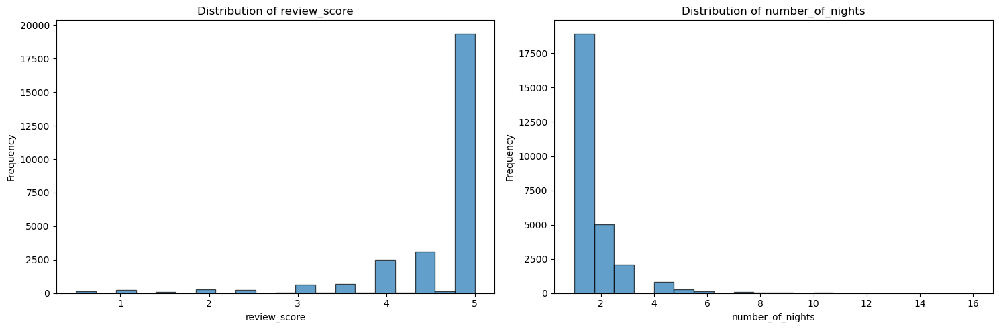

In [28]:
# Plot numerical variables
numerical_cols = ['review_score', 'number_of_nights']
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

for i, col in enumerate(numerical_cols):
    data_to_plot = df_clean.select(col).drop_nulls().to_series()

    axes[i].hist(data_to_plot, bins=20, alpha=0.7, edgecolor='black')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()

#### Distribution Plot: Review Score and Review Score Counts

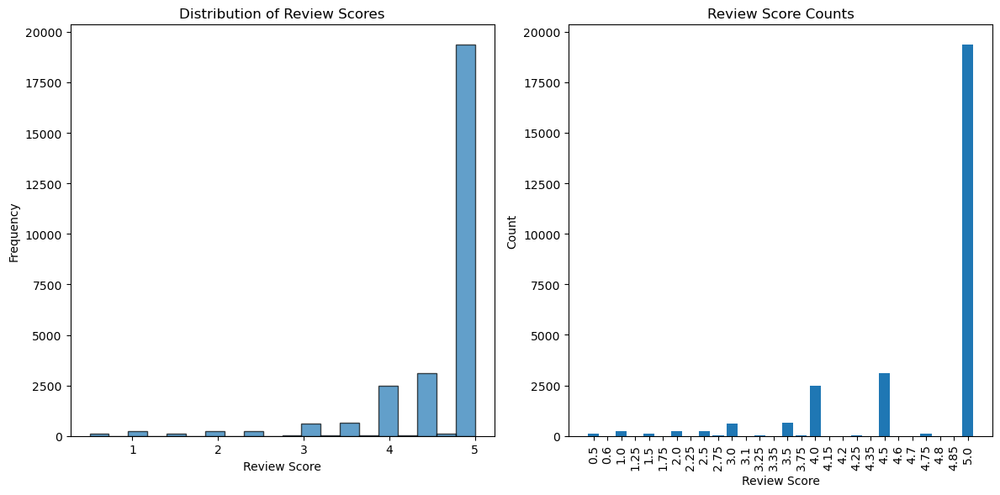


Review Score Statistics:
Mean: 4.65
Median: 5.00
Standard Deviation: 0.75


In [31]:
# --- Review score distribution ---
plt.figure(figsize=(12, 6))

# --- Subplot 1: Histogram ---
plt.subplot(1, 2, 1)

# Polars: Select data, drop nulls, convert to series, then plot with plt.hist()
hist_data = df_clean.select("review_score").drop_nulls().to_series()
plt.hist(hist_data, bins=20, alpha=0.7, edgecolor='black')

plt.title('Distribution of Review Scores')
plt.xlabel('Review Score')
plt.ylabel('Frequency')

# --- Subplot 2: Bar Chart ---
plt.subplot(1, 2, 2)

# Polars: Get the column as a Series, then call value_counts()
score_counts = (
    df_clean.get_column("review_score")  # <-- Use .get_column() here
    .drop_nulls()
    .value_counts()                     # This returns a DataFrame
    .sort("review_score")               # Sort by the value
)

# This forces matplotlib to treat them as categorical labels
x_labels = score_counts.get_column("review_score").cast(pl.String)
y_values = score_counts.get_column("count")

# Pass the string labels and numeric values to plt.bar()
plt.bar(x_labels, y_values)

plt.xticks(rotation=90) # Rotates the x-axis labels
plt.title('Review Score Counts')
plt.xlabel('Review Score')
plt.ylabel('Count')


plt.tight_layout()
plt.show() 

# --- Review score statistics ---
print("\nReview Score Statistics:")

# Polars: Use .select() and the expression, then .item() to get the number
# Polars' .mean(), .median(), and .std() all ignore nulls by default
mean_val = df_clean.select(pl.col("review_score").mean()).item()
median_val = df_clean.select(pl.col("review_score").median()).item()
std_val = df_clean.select(pl.col("review_score").std()).item()

print(f"Mean: {mean_val:.2f}")
print(f"Median: {median_val:.2f}")
print(f"Standard Deviation: {std_val:.2f}")

#### Relationship
##### 1. Review score by traveler type
##### 2. Review score by room category
##### 3. Review score by room view
##### 4. Review score by number of nights

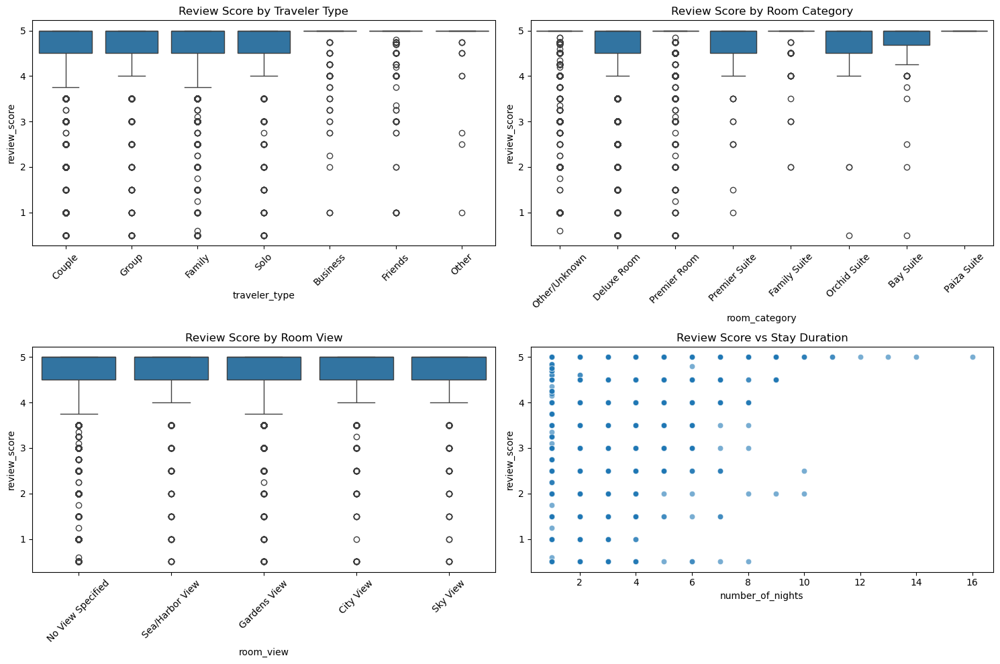

In [34]:
# Relationship between variables and review scores
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# --- Polars/Pandas-agnostic  ---

# Review score by traveler type
sns.boxplot(data=df_clean, x='traveler_type', y='review_score', ax=axes[0,0])
axes[0,0].set_title('Review Score by Traveler Type')
axes[0,0].tick_params(axis='x', rotation=45)

# Review score by room category
sns.boxplot(data=df_clean, x='room_category', y='review_score', ax=axes[0,1])
axes[0,1].set_title('Review Score by Room Category')
axes[0,1].tick_params(axis='x', rotation=45)

# Review score by room view
sns.boxplot(data=df_clean, x='room_view', y='review_score', ax=axes[1,0])
axes[1,0].set_title('Review Score by Room View')
axes[1,0].tick_params(axis='x', rotation=45)

# Review score by number of nights
sns.scatterplot(data=df_clean, x='number_of_nights', y='review_score', alpha=0.6, ax=axes[1,1])
axes[1,1].set_title('Review Score vs Stay Duration')

plt.tight_layout()
plt.show()

#### Top reviewer countries

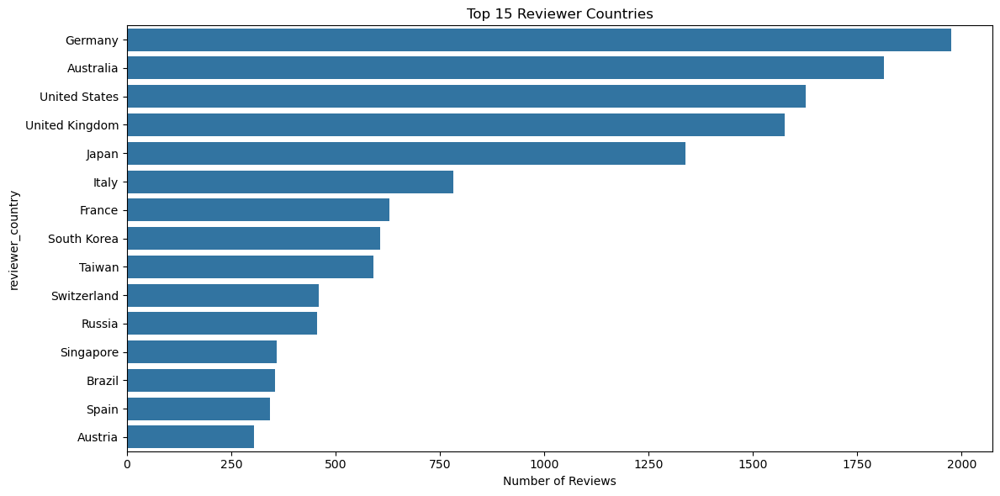

Average Scores by Country (min 5 reviews):
shape: (10, 3)
┌──────────────────┬──────────────┬───────────────┐
│ reviewer_country ┆ review_count ┆ average_score │
│ ---              ┆ ---          ┆ ---           │
│ str              ┆ u32          ┆ f64           │
╞══════════════════╪══════════════╪═══════════════╡
│ Texas            ┆ 7            ┆ 5.0           │
│ Uganda           ┆ 6            ┆ 5.0           │
│ Florida          ┆ 7            ┆ 5.0           │
│ Georgia          ┆ 15           ┆ 4.97          │
│ Egypt            ┆ 10           ┆ 4.95          │
│ Venezuela        ┆ 9            ┆ 4.94          │
│ Costa Rica       ┆ 11           ┆ 4.91          │
│ Belarus          ┆ 15           ┆ 4.9           │
│ Moldova          ┆ 10           ┆ 4.9           │
│ Peru             ┆ 26           ┆ 4.88          │
└──────────────────┴──────────────┴───────────────┘


In [36]:
# Top reviewer countries
plt.figure(figsize=(12, 6))

top_countries = (
    df_clean
    .filter(pl.col('reviewer_country') != 'Unknown')  # Filter away 'Unknown' as not meaningful
    .get_column('reviewer_country')
    .drop_nulls()
    .value_counts()
    .sort("count", descending=True)  # sort in descending count
    .head(15)
)

# Pass the DataFrame directly to seaborn's 'data' argument
# 'value_counts()' creates 'reviewer_country' and 'count' columns
sns.barplot(data=top_countries, x='count', y='reviewer_country')

plt.title('Top 15 Reviewer Countries')
plt.xlabel('Number of Reviews')
plt.tight_layout()
plt.show()

# Average score by country (for countries with sufficient reviews)

country_stats = (
    df_clean
    .filter(pl.col('reviewer_country') != 'Unknown') # <-- Also added the 'Unknown' filter here
    .group_by('reviewer_country')
    .agg(
        # Define aggregations and name them with .alias()
        pl.col('review_score').count().alias('review_count'),
        pl.col('review_score').mean().round(2).alias('average_score')
    )
    .filter(pl.col('review_count') >= 5)  # Chain the filter
    .sort('average_score', descending=True) # Chain the sort
)

print("Average Scores by Country (min 5 reviews):")
print(country_stats.head(10))

#### Review Text Analysis

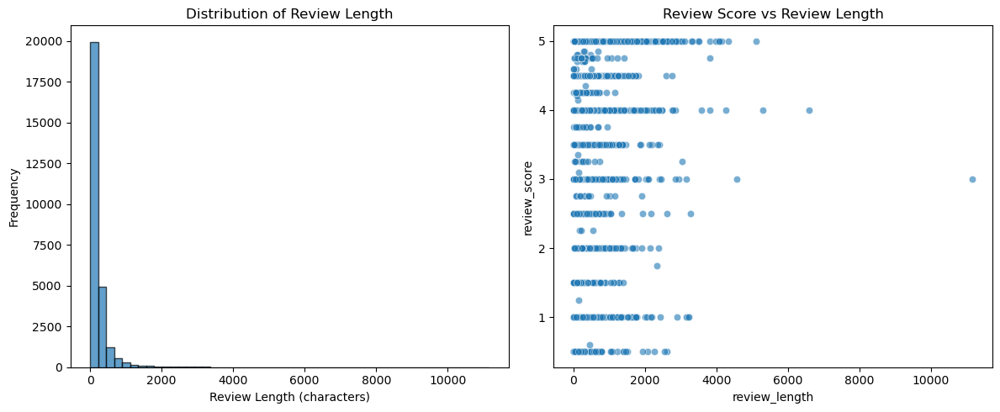

Average review length: 182 characters
Median review length: 96 characters


In [38]:
# 1. Basic text analysis - Create the 'review_length' column
# .str.len_chars() is the Polars equivalent of .str.len()
df_clean = df_clean.with_columns(
    pl.col("cleaned_review_text").str.len_chars().alias("review_length")
)

# 2. Plotting
plt.figure(figsize=(12, 5))

# --- Subplot 1: Histogram ---
plt.subplot(1, 2, 1)

# Polars: Select data, drop nulls, convert to series
hist_data = df_clean.select("review_length").drop_nulls().to_series()
plt.hist(hist_data, bins=50, alpha=0.7, edgecolor='black')

plt.title('Distribution of Review Length')
plt.xlabel('Review Length (characters)')
plt.ylabel('Frequency')

# --- Subplot 2: Scatter Plot ---
plt.subplot(1, 2, 2)
sns.scatterplot(data=df_clean, x='review_length', y='review_score', alpha=0.6)
plt.title('Review Score vs Review Length')

plt.tight_layout()
plt.show()

# 3. Statistics
# Polars: .select() and .item() used to extract the scalar value
avg_length = df_clean.select(pl.col("review_length").mean()).item()
median_length = df_clean.select(pl.col("review_length").median()).item()

print(f"Average review length: {avg_length:.0f} characters")
print(f"Median review length: {median_length:.0f} characters")

#### Correlation Matrix on review_score and number_of_nights

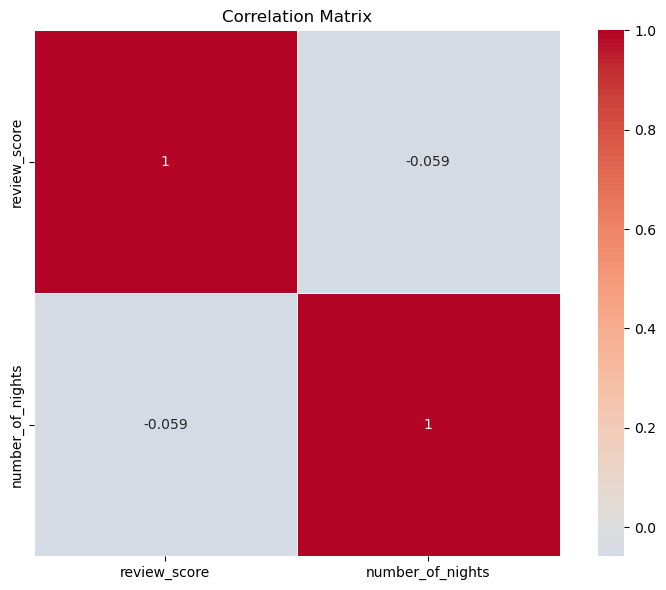

In [42]:
# --- Step 1: Select the two columns ---
numerical_df = df_clean.select([
    "review_score",
    "number_of_nights"
])

# --- Step 2: Find the correlation ---
corr_matrix_pl = numerical_df.corr()

"""
[Documentation - to see next code block for illustration] 

Why this conversion is necessary:

A conversion is required because Polars' .corr() method outputs a different data 
structure than pandas. 

1. Pandas .corr() returns a simple square (N, N) matrix that seaborn.heatmap 
   directly understands.
2. Polars .corr() returns a non-square (N, N+1) DataFrame, which includes 
   one *string* column for the row labels and *N float* columns for the data.

The code below manually parses this Polars output:
- 3a: Selects all float columns (cs.float()) to get the data.
- 3b: Selects the string column (cs.string()) to get the labels.
- 3c: Rebuilds the square pandas DataFrame that seaborn.heatmap expects.
"""

# --- Step 3: Plot the matrix (requires fixing the Polars output) ---

# 3a. Get the data: Select only the float (f64) columns
corr_matrix_np = corr_matrix_pl.select(cs.float()).to_numpy()

# 3b. Manually assign the column names
col_names = ["review_score", "number_of_nights"]

# 3c. Build the clean, square pandas-style matrix
corr_matrix_pd = pd.DataFrame(corr_matrix_np, index=col_names, columns=col_names)

# 3d. Plot the final, correct 2x2 matrix
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix_pd, annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

In [43]:
print("--- Illustrating .corr() Differences ---")

# 1. Create identical DataFrames for comparison
data = {"A": [1, 2, 3], "B": [4, 2, 0]}
df_pandas = pd.DataFrame(data)
df_polars = pl.DataFrame(data)

# 2. Pandas .corr() output:
#    Returns a simple, square (N, N) matrix.
print("\n--- 1. Pandas .corr() ---")
pandas_corr = df_pandas.corr()
print(pandas_corr)
print(f"Shape: {pandas_corr.shape}")

# 3. Polars .corr() output:
#    Returns a non-square (N, N+1) DataFrame with a string label column.
print("\n--- 2. Polars .corr() ---")
polars_corr = df_polars.corr()
print(polars_corr)
print(f"Shape: {polars_corr.shape}")
print(f"Dtypes: {polars_corr.dtypes}")

--- Illustrating .corr() Differences ---

--- 1. Pandas .corr() ---
     A    B
A  1.0 -1.0
B -1.0  1.0
Shape: (2, 2)

--- 2. Polars .corr() ---
shape: (2, 2)
┌──────┬──────┐
│ A    ┆ B    │
│ ---  ┆ ---  │
│ f64  ┆ f64  │
╞══════╪══════╡
│ 1.0  ┆ -1.0 │
│ -1.0 ┆ 1.0  │
└──────┴──────┘
Shape: (2, 2)
Dtypes: [Float64, Float64]


#### Key Insights (Polars)

In [48]:
def generate_insights_polars(df):
    insights = []
    
    # --- 1. Basic Stats ---
    # len() works on Polars DataFrames
    total_reviews = len(df) 
    
    # Use .select(pl.col(...).agg()).item() to get a single value
    avg_score = df.select(pl.col("review_score").mean()).item()
    
    # .mode() returns a Series, so use .first() to get the top one
    common_traveler = df.select(pl.col("traveler_type").mode().first()).item()
    common_room = df.select(pl.col("room_category").mode().first()).item()
    avg_nights = df.select(pl.col("number_of_nights").mean()).item()

    # --- 2. Date Ranges ---
    # .min() and .max() follow the same .select().item() pattern
    min_review_date = df.select(pl.col("review_date").min()).item()
    max_review_date = df.select(pl.col("review_date").max()).item()
    min_stay_date = df.select(pl.col("stay_date").min()).item()
    max_stay_date = df.select(pl.col("stay_date").max()).item()
    
    # --- 3. Top Performers ---
    # Polars equivalent of groupby().mean().idxmax()
    # We group_by, aggregate, sort, and take the first row
    top_view_stats = (
        df.group_by('room_view')
        .agg(pl.col('review_score').mean().alias('avg_score'))
        .sort('avg_score', descending=True)
        .head(1)
    )
    
    # Extract the values from the resulting (1, 2) DataFrame
    top_room_view = top_view_stats.item(0, 'room_view') # (row, col)
    top_room_score = top_view_stats.item(0, 'avg_score') # (row, col)

    # --- 4. Append Insights ---
    # The f-string formatting part remains identical
    insights.append(f"Total Reviews: {total_reviews:,}")
    insights.append(f"Average Review Score: {avg_score:.2f}")
    insights.append(f"Most Common Traveler Type: {common_traveler}")
    insights.append(f"Most Common Room Category: {common_room}")
    insights.append(f"Average Stay Duration: {avg_nights:.1f} nights")
    
    insights.append(f"Review Date Range: {min_review_date} to {max_review_date}")
    insights.append(f"Stay Date Range: {min_stay_date} to {max_stay_date}")
    
    insights.append(f"Highest Rated Room View: {top_room_view} ({top_room_score:.2f})")
    
    return insights

# --- Run the function ---
print("KEY INSIGHTS (Polars):")
print("=" * 50)
# Make sure to pass your Polars DataFrame `df_clean`
for insight in generate_insights_polars(df_clean):
    print(f"• {insight}")

KEY INSIGHTS (Polars):
• Total Reviews: 27,392
• Average Review Score: 4.65
• Most Common Traveler Type: Couple
• Most Common Room Category: Deluxe Room
• Average Stay Duration: 1.5 nights
• Review Date Range: 0001-09-10 00:00:00 to 2025-09-25 23:50:20.603987
• Stay Date Range: 2013-08-27 00:09:39.396013 to 2025-09-01 00:00:00
• Highest Rated Room View: Gardens View (4.68)


#### Text Processing for Word Cloud Analysis

In [51]:
# 1. Apply Text Preprocessing and Categorization
# We do both operations in a single, efficient .with_columns() block

df_clean = df_clean.with_columns(
    
    # --- Polars equivalent of preprocess_text() ---
    pl.when(
        (pl.col("cleaned_review_text").is_null()) | 
        (pl.col("cleaned_review_text") == "No review text provided")
    )
    .then(pl.lit("")) # Set to empty string
    .otherwise(
        pl.col("cleaned_review_text")
          .str.to_lowercase()                # Convert to lowercase
          .str.replace_all(r"[^a-zA-Z\s]", "") # Remove special chars/digits
          .str.replace_all(r"\s+", " ")        # Collapse whitespace
          .str.strip_chars()                   # Remove leading/trailing space
    )
    .alias("cleaned_review_text_wordcloud"), # Name the new column
    
    # --- Polars equivalent of categorize_score() ---
    pl.when(pl.col("review_score") >= 4.5)
      .then(pl.lit("Excellent (4.5-5.0)"))
    .when(pl.col("review_score") >= 4.0)
      .then(pl.lit("Very Good (4.0-4.4)"))
    .when(pl.col("review_score") >= 3.0)
      .then(pl.lit("Good (3.0-3.9)"))
    .otherwise(pl.lit("Poor (<3.0)"))
    .alias("score_category") # Name the new column
)

# 2. Custom stopwords (This code is pure Python and remains unchanged)
custom_stopwords = set(STOPWORDS)
hotel_stopwords = {
    'hotel', 'stay', 'stayed', 'room', 'rooms', 'would', 'could', 'also', 
    'one', 'two', 'three', 'first', 'last', 'stay', 'staying', 'get', 'got',
    'marina', 'bay', 'sands', 'mbs', 'singapore', 'room', 'rooms'
}
custom_stopwords.update(hotel_stopwords)

In [53]:
df_clean = df_clean.with_columns(
    pl.when(pl.col("review_score") >= 4.5)
      .then(pl.lit("Excellent (4.5-5.0)")) # pl.lit() creates a literal string
    .when(pl.col("review_score") >= 4.0)
      .then(pl.lit("Very Good (4.0-4.4)"))
    .when(pl.col("review_score") >= 3.0)
      .then(pl.lit("Good (3.0-3.9)"))
    .otherwise(pl.lit("Poor (<3.0)"))      # This also catches any nulls
    .alias("score_category")               # This creates the new column
)

##### Word Clouds by Review Score Categories

Word Clouds by Review Score Categories:


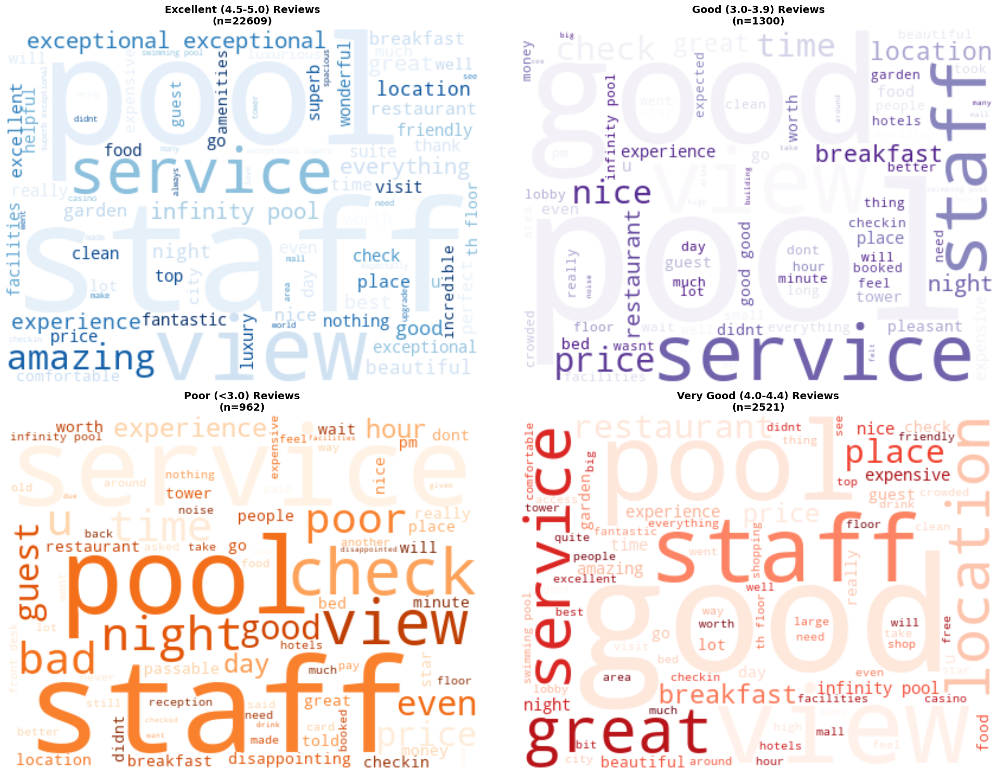

In [56]:
# Fixed Word Clouds by Review Score Categories
print("Word Clouds by Review Score Categories:")

# Polars: Get unique values as a Series, then sort it
score_categories = df_clean.get_column('score_category').unique().sort()

# Use proper matplotlib colormaps
colormaps = ['Blues', 'Purples', 'Oranges', 'Reds']

fig, axes = plt.subplots(2, 2, figsize=(20, 15))
axes = axes.ravel()

for i, category in enumerate(score_categories):
    # Polars: Filter the DataFrame, get the column, and convert to a list
    category_df = df_clean.filter(pl.col('score_category') == category)
    category_reviews = ' '.join(category_df.get_column('cleaned_review_text_wordcloud').to_list())
    
    if category_reviews.strip():
        wordcloud = WordCloud(
            width=400, height=300, 
            background_color='white',
            stopwords=custom_stopwords,
            max_words=80,
            colormap=colormaps[i],
            random_state=42
        ).generate(category_reviews)
        
        axes[i].imshow(wordcloud, interpolation='bilinear')
        
        # Polars: Get the length of the filtered DataFrame
        axes[i].set_title(f'{category} Reviews\n(n={len(category_df)})', 
                          fontsize=14, fontweight='bold')
    else:
        axes[i].text(0.5, 0.5, 'No reviews', ha='center', va='center', transform=axes[i].transAxes, fontsize=12)
    
    axes[i].axis('off')

plt.tight_layout()
plt.show()

##### Word Clouds by Traveler Type

Word Clouds by Traveler Type:


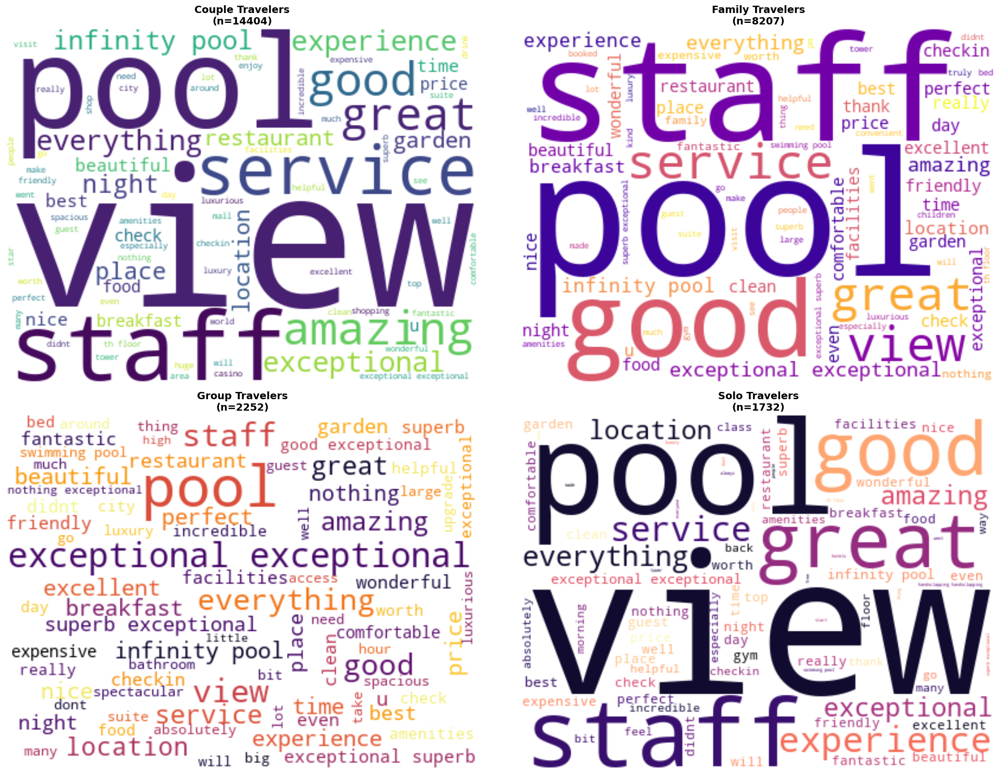

In [58]:
print("Word Clouds by Traveler Type:")

# Polars: Get value_counts (DataFrame), sort by count, take top 4,
# then get the 'traveler_type' column as a Series to iterate over.
top_travelers_df = (
    df_clean.get_column('traveler_type')
    .value_counts()
    .sort("count", descending=True)
    .head(4)
)
top_travelers = top_travelers_df.get_column('traveler_type')

fig, axes = plt.subplots(2, 2, figsize=(20, 15))
axes = axes.ravel()

# Use different colormaps for variety
traveler_colormaps = ['viridis', 'plasma', 'inferno', 'magma']

for i, traveler in enumerate(top_travelers):
    # Polars: Filter the DataFrame, get the column, and convert to a list
    traveler_df = df_clean.filter(pl.col('traveler_type') == traveler)
    traveler_reviews = ' '.join(traveler_df.get_column('cleaned_review_text_wordcloud').to_list())
    
    if traveler_reviews.strip():
        wordcloud = WordCloud(
            width=400, height=300, 
            background_color='white',
            stopwords=custom_stopwords,
            max_words=80,
            colormap=traveler_colormaps[i],
            random_state=42
        ).generate(traveler_reviews)
        
        axes[i].imshow(wordcloud, interpolation='bilinear')
        
        # Polars: Get the length of the filtered DataFrame
        axes[i].set_title(f'{traveler} Travelers\n(n={len(traveler_df)})', 
                          fontsize=14, fontweight='bold')
    else:
        axes[i].text(0.5, 0.5, 'No reviews', ha='center', va='center', transform=axes[i].transAxes, fontsize=12)
    
    axes[i].axis('off')

plt.tight_layout()
plt.show()

##### Overall Word Cloud

Overall Word Cloud:


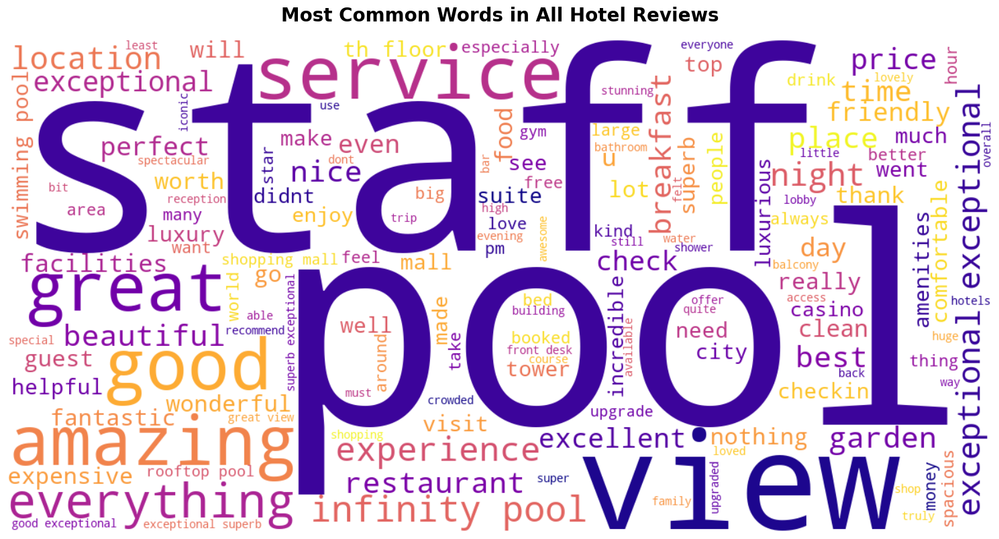

In [60]:
print("Overall Word Cloud:")

# Use .get_column() to select the Series, then .to_list()
all_reviews = ' '.join(df_clean.get_column('cleaned_review_text_wordcloud').to_list())
# -------------------------

plt.figure(figsize=(15, 8))
wordcloud = WordCloud(
    width=1200, 
    height=600, 
    background_color='white',
    stopwords=custom_stopwords,
    max_words=150,
    colormap='plasma',
    random_state=42
).generate(all_reviews)

plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Common Words in All Hotel Reviews', fontsize=20, fontweight='bold', pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

##### Word Frequency Analysis

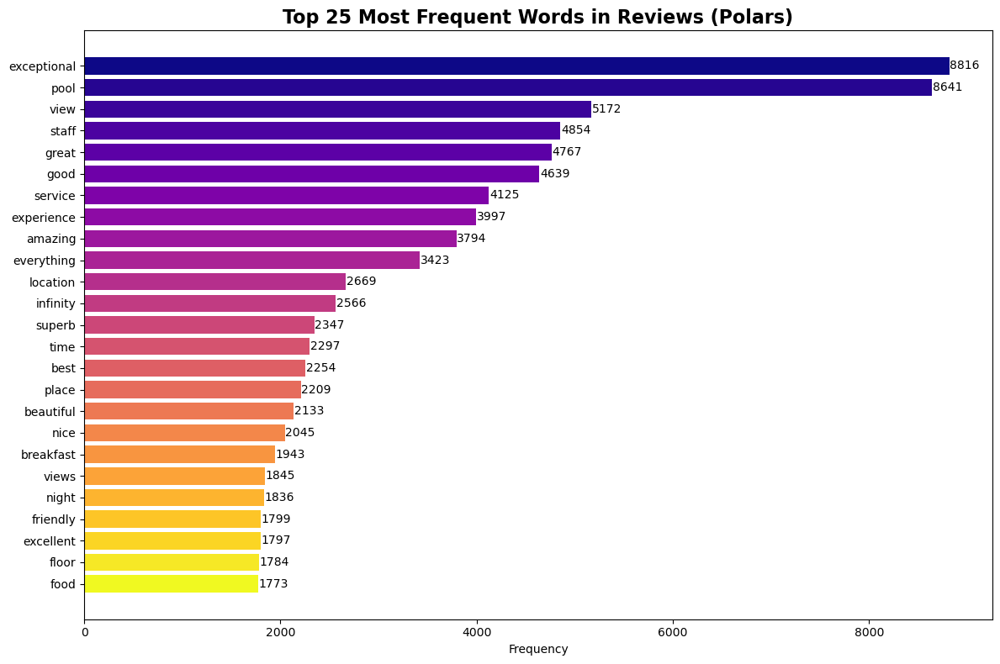

In [62]:
# --- Polars Word Frequency Analysis ---
# This replaces the analyze_word_frequency function and all_reviews string.

top_words_df = (
    df_clean.select(
        pl.col("cleaned_review_text_wordcloud").str.split(" ")
    )
    .explode("cleaned_review_text_wordcloud")
    .rename({"cleaned_review_text_wordcloud": "word"})
    .filter(
        pl.col("word").is_in(custom_stopwords).not_() & 
        (pl.col("word").str.len_chars() > 2) &
        (pl.col("word") != "")
    )
    # Call .get_column() to get the Series, *then* call .value_counts()
    .get_column("word")
    .value_counts(sort=True) 
    .head(25)
)

# --- Create bar chart for top words ---
plt.figure(figsize=(12, 8))

# Extract words and frequencies from the Polars DataFrame
words = top_words_df.get_column("word")
frequencies = top_words_df.get_column("count") 

colors = plt.cm.plasma(np.linspace(0, 1, len(words)))

bars = plt.barh(words, frequencies, color=colors)
plt.xlabel('Frequency')
plt.title('Top 25 Most Frequent Words in Reviews (Polars)', fontsize=16, fontweight='bold')
plt.gca().invert_yaxis() # Invert y-axis to show largest on top

# Add value labels on bars
for bar, freq in zip(bars, frequencies):
    plt.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2, 
             f'{freq}', ha='left', va='center', fontsize=10)

plt.tight_layout()
plt.show()

#### Final Data Quality Report

In [64]:
# --- Pre-calculate all values ---

# Basic counts
total_records = len(df_clean)

# Wrap the condition in pl.all_horizontal()
complete_cases = df_clean.filter(pl.all_horizontal(pl.all().is_not_null())).height

completeness_pct = (complete_cases / total_records) * 100

# Averages (use .item() to extract the single value)
avg_score = df_clean.select(pl.col("review_score").mean()).item()
avg_nights = df_clean.select(pl.col("number_of_nights").mean()).item()
avg_length = df_clean.select(pl.col("review_length").mean()).item()

# Value counts (Polars .value_counts() returns a DataFrame)
score_dist = (
    df_clean.get_column("score_category")
    .value_counts()
    .sort("score_category") # Polars equivalent of .sort_index()
)
top_travelers = (
    df_clean.get_column("traveler_type")
    .value_counts()
    .sort("count", descending=True) # Polars equivalent of default .value_counts()
    .head(5)
)
top_countries = (
    df_clean.get_column("reviewer_country")
    .value_counts()
    .sort("count", descending=True)
    .head(5)
)

# --- Print the Report ---
print("=" * 60)
print("FINAL DATA QUALITY REPORT (Polars)")
print("=" * 60)
print(f"Total records: {total_records:,}")
print(f"Complete cases: {complete_cases:,}")
print(f"Data completeness: {completeness_pct:.2f}%")
print(f"Average review score: {avg_score:.2f}")
print(f"Average stay duration: {avg_nights:.1f} nights")
print(f"Average review length: {avg_length:.0f} characters")

print(f"\nReview score distribution:")
print(score_dist)

print(f"\nTop traveler types:")
print(top_travelers)

print(f"\nTop reviewer countries:")
print(top_countries)

FINAL DATA QUALITY REPORT (Polars)
Total records: 27,392
Complete cases: 27,387
Data completeness: 99.98%
Average review score: 4.65
Average stay duration: 1.5 nights
Average review length: 182 characters

Review score distribution:
shape: (4, 2)
┌─────────────────────┬───────┐
│ score_category      ┆ count │
│ ---                 ┆ ---   │
│ str                 ┆ u32   │
╞═════════════════════╪═══════╡
│ Excellent (4.5-5.0) ┆ 22609 │
│ Good (3.0-3.9)      ┆ 1300  │
│ Poor (<3.0)         ┆ 962   │
│ Very Good (4.0-4.4) ┆ 2521  │
└─────────────────────┴───────┘

Top traveler types:
shape: (5, 2)
┌───────────────┬───────┐
│ traveler_type ┆ count │
│ ---           ┆ ---   │
│ str           ┆ u32   │
╞═══════════════╪═══════╡
│ Couple        ┆ 14404 │
│ Family        ┆ 8207  │
│ Group         ┆ 2252  │
│ Solo          ┆ 1732  │
│ Friends       ┆ 509   │
└───────────────┴───────┘

Top reviewer countries:
shape: (5, 2)
┌──────────────────┬───────┐
│ reviewer_country ┆ count │
│ ---          

#### Export

In [67]:
# Export the DataFrame to a CSV file
df_clean.write_csv("../Output/imputed_reviews_polars.csv")

print("DataFrame exported to imputed_reviews_polars.csv in the Output directory")

DataFrame exported to imputed_reviews_polars.csv in the Output directory


### Pandas

#### Load Data

In [71]:
# Load the data
df = pd.read_csv('../Output/cleaned_reviews_pandas.csv')

#### Missing Values Check

In [73]:
print("Missing Values Before Treatment:")
print(df.isnull().sum())
print(f"\nTotal missing values: {df.isnull().sum().sum()}")

# Create a copy for missing value treatment
df_clean = df.copy()

Missing Values Before Treatment:
id                     0
source                 0
reviewer_name          1
review_text            5
review_score           2
review_date            3
stay_date           5101
reviewer_country    7853
room_type           8067
number_of_nights    8496
traveler_type       4981
room_category          0
room_view              0
dtype: int64

Total missing values: 34509


#### Missing Values Treatment

In [75]:
# 1. reviewer_name (1 missing) - fill with 'Anonymous'
df_clean['reviewer_name'] = df_clean['reviewer_name'].fillna('Anonymous')

# 2. review_text (5 missing) - fill with 'No review text provided'
df_clean['cleaned_review_text'] = df_clean['review_text'].fillna('No review text provided')

# 3. review_score (2 missing) - fill with median
review_score_median = df_clean['review_score'].median()
df_clean['review_score'] = df_clean['review_score'].fillna(review_score_median)

# 4. Convert date columns to datetime with error handling
df_clean['review_date'] = pd.to_datetime(df_clean['review_date'], errors='coerce')
df_clean['stay_date'] = pd.to_datetime(df_clean['stay_date'], errors='coerce')

# 5. Handle review_date missing values (3 missing)
# Try to infer from stay_date + average lag
available_review_lag = (df_clean['review_date'] - df_clean['stay_date']).dt.days
avg_review_lag = available_review_lag.mean()

if pd.notna(avg_review_lag):
    # Fill missing review_date with stay_date + average lag
    mask_review_missing = df_clean['review_date'].isna() & df_clean['stay_date'].notna()
    df_clean.loc[mask_review_missing, 'review_date'] = df_clean.loc[mask_review_missing, 'stay_date'] + pd.Timedelta(days=avg_review_lag)

# For any remaining missing review_date, use the most common review date
if df_clean['review_date'].isna().any():
    most_common_review_date = df_clean['review_date'].mode()[0] if not df_clean['review_date'].mode().empty else pd.Timestamp('2025-01-01')
    df_clean['review_date'] = df_clean['review_date'].fillna(most_common_review_date)

# 6. Handle stay_date missing values (5101 missing)
# Fill missing stay_date with review_date - average lag
mask_stay_missing = df_clean['stay_date'].isna() & df_clean['review_date'].notna()
df_clean.loc[mask_stay_missing, 'stay_date'] = df_clean.loc[mask_stay_missing, 'review_date'] - pd.Timedelta(days=avg_review_lag)

# For any remaining missing stay_date, use the most common stay date
if df_clean['stay_date'].isna().any():
    most_common_stay_date = df_clean['stay_date'].mode()[0] if not df_clean['stay_date'].mode().empty else pd.Timestamp('2025-01-01')
    df_clean['stay_date'] = df_clean['stay_date'].fillna(most_common_stay_date)

# 7. reviewer_country (7853 missing) - fill with mode
most_common_country = df_clean['reviewer_country'].mode()[0] if not df_clean['reviewer_country'].mode().empty else 'Unknown'
df_clean['reviewer_country'] = df_clean['reviewer_country'].fillna(most_common_country)

# 8. room_type (8067 missing) - use room_category information or fill with mode
if df_clean['room_type'].isna().any():
    # Try to extract room type from room_category if possible
    mask_room_type_missing = df_clean['room_type'].isna()
    df_clean.loc[mask_room_type_missing, 'room_type'] = df_clean.loc[mask_room_type_missing, 'room_category']
    
    # Fill any remaining with mode
    most_common_room_type = df_clean['room_type'].mode()[0] if not df_clean['room_type'].mode().empty else 'Standard Room'
    df_clean['room_type'] = df_clean['room_type'].fillna(most_common_room_type)

# 9. number_of_nights (8496 missing) - fill with median
nights_median = df_clean['number_of_nights'].median()
df_clean['number_of_nights'] = df_clean['number_of_nights'].fillna(nights_median)

# 10. traveler_type (4981 missing) - fill with mode
most_common_traveler = df_clean['traveler_type'].mode()[0] if not df_clean['traveler_type'].mode().empty else 'Couple'
df_clean['traveler_type'] = df_clean['traveler_type'].fillna(most_common_traveler)

# 11. Calculate review_lag_days
df_clean['review_lag_days'] = (df_clean['review_date'] - df_clean['stay_date']).dt.days
# 12. Calculate review_length
df_clean['review_length'] = df_clean['cleaned_review_text'].str.len()

print("\nMissing Values After Comprehensive Treatment:")
print(df_clean.isnull().sum())
print(f"\nTotal missing values: {df_clean.isnull().sum().sum()}")




Missing Values After Comprehensive Treatment:
id                     0
source                 0
reviewer_name          0
review_text            5
review_score           0
review_date            0
stay_date              0
reviewer_country       0
room_type              0
number_of_nights       0
traveler_type          0
room_category          0
room_view              0
cleaned_review_text    0
review_lag_days        0
review_length          0
dtype: int64

Total missing values: 5


#### Duplicates Check

In [77]:
# Check for duplicates
print(f"Duplicate rows: {df_clean.duplicated().sum()}")

# Check for missing values percentage
missing_percent = (df_clean.isnull().sum() / len(df)) * 100
print("\nMissing Values Percentage:")
print(missing_percent[missing_percent > 0])

# Basic statistics for numerical columns
print("\nNumerical Columns Statistics:")
print(df_clean.describe())

Duplicate rows: 0

Missing Values Percentage:
review_text    0.018254
dtype: float64

Numerical Columns Statistics:
                 id  review_score                    review_date  \
count  27392.000000  27392.000000                          27392   
mean   13930.662091      4.649765  2023-09-10 11:35:30.140186880   
min        0.000000      0.500000            1900-09-01 00:00:00   
25%     6848.750000      4.500000            2023-06-11 00:00:00   
50%    13727.500000      5.000000            2024-01-16 12:00:00   
75%    20630.250000      5.000000            2024-10-05 00:00:00   
max    28988.000000      5.000000            2025-09-22 00:00:00   
std     8246.692980      0.748483                            NaN   

                           stay_date  number_of_nights  review_lag_days  \
count                          27392      27392.000000     27392.000000   
mean   2024-01-10 23:32:49.286030592          1.516173      -122.591596   
min    2014-01-21 11:57:19.145843614          

#### Distribution Plot: Review Score and Number of Nights

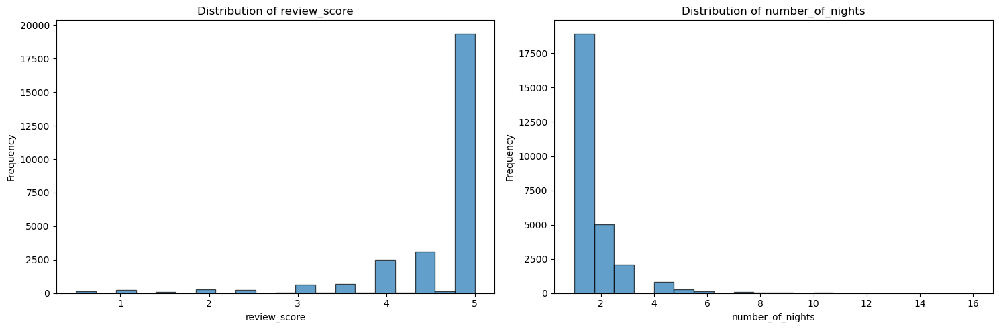

In [79]:
# Plot numerical variables
numerical_cols = ['review_score', 'number_of_nights']
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

for i, col in enumerate(numerical_cols):
    axes[i].hist(df_clean[col].dropna(), bins=20, alpha=0.7, edgecolor='black')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

#### Distribution Plot: Review Score and Review Score Counts

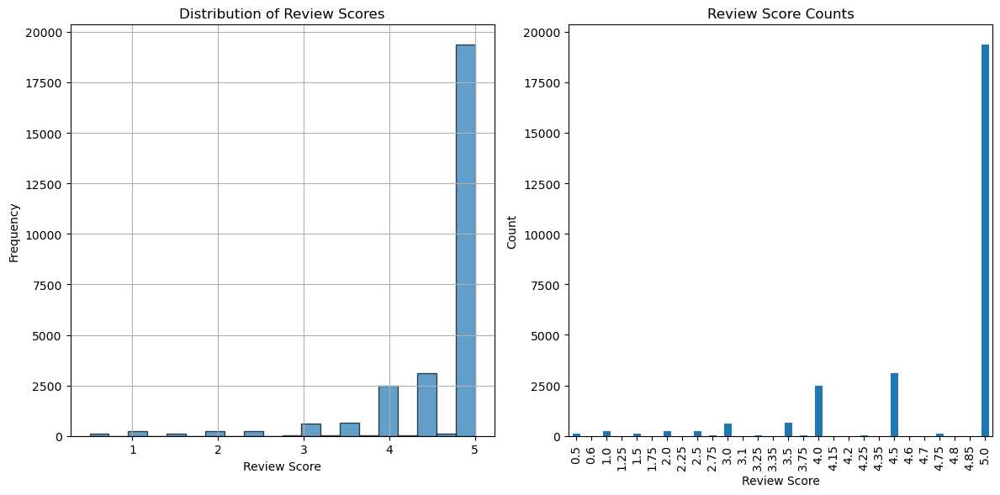

Review Score Statistics:
Mean: 4.65
Median: 5.00
Standard Deviation: 0.75


In [81]:
# Review score distribution
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
df_clean['review_score'].hist(bins=20, alpha=0.7, edgecolor='black')
plt.title('Distribution of Review Scores')
plt.xlabel('Review Score')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
df_clean['review_score'].value_counts().sort_index().plot(kind='bar')
plt.title('Review Score Counts')
plt.xlabel('Review Score')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

# Review score statistics
print("Review Score Statistics:")
print(f"Mean: {df_clean['review_score'].mean():.2f}")
print(f"Median: {df_clean['review_score'].median():.2f}")
print(f"Standard Deviation: {df_clean['review_score'].std():.2f}")

#### Relationship
##### 1. Review score by traveler type
##### 2. Review score by room category
##### 3. Review score by room view
##### 4. Review score by number of nights

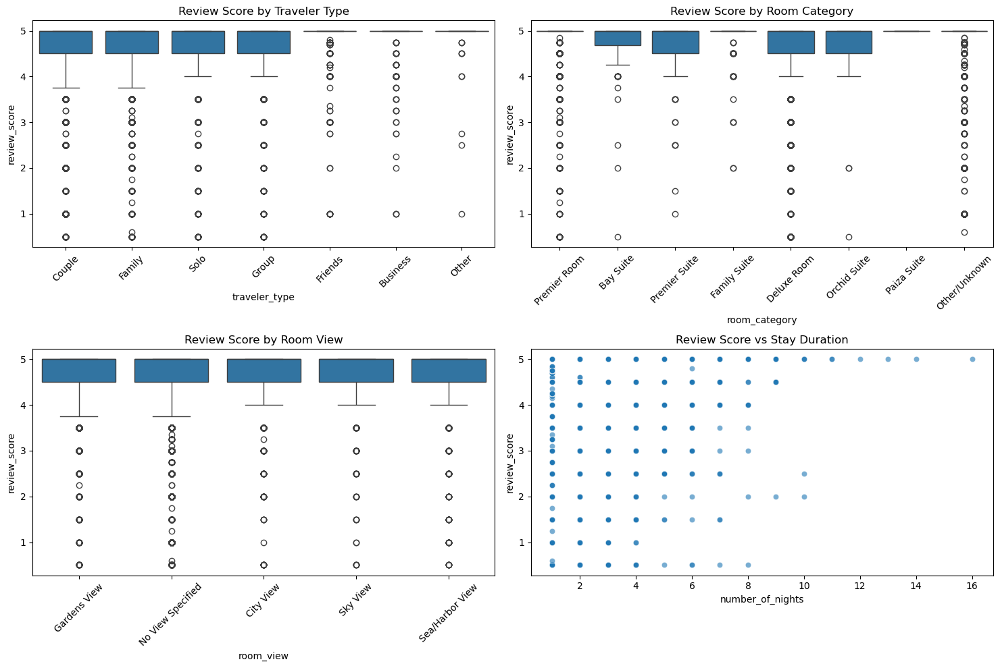

In [87]:
# Relationship between variables and review scores
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Review score by traveler type
sns.boxplot(data=df_clean, x='traveler_type', y='review_score', ax=axes[0,0])
axes[0,0].set_title('Review Score by Traveler Type')
axes[0,0].tick_params(axis='x', rotation=45)

# Review score by room category
sns.boxplot(data=df_clean, x='room_category', y='review_score', ax=axes[0,1])
axes[0,1].set_title('Review Score by Room Category')
axes[0,1].tick_params(axis='x', rotation=45)

# Review score by room view
sns.boxplot(data=df_clean, x='room_view', y='review_score', ax=axes[1,0])
axes[1,0].set_title('Review Score by Room View')
axes[1,0].tick_params(axis='x', rotation=45)

# Review score by number of nights
sns.scatterplot(data=df_clean, x='number_of_nights', y='review_score', alpha=0.6, ax=axes[1,1])
axes[1,1].set_title('Review Score vs Stay Duration')

plt.tight_layout()
plt.show()

#### Top reviewer countries

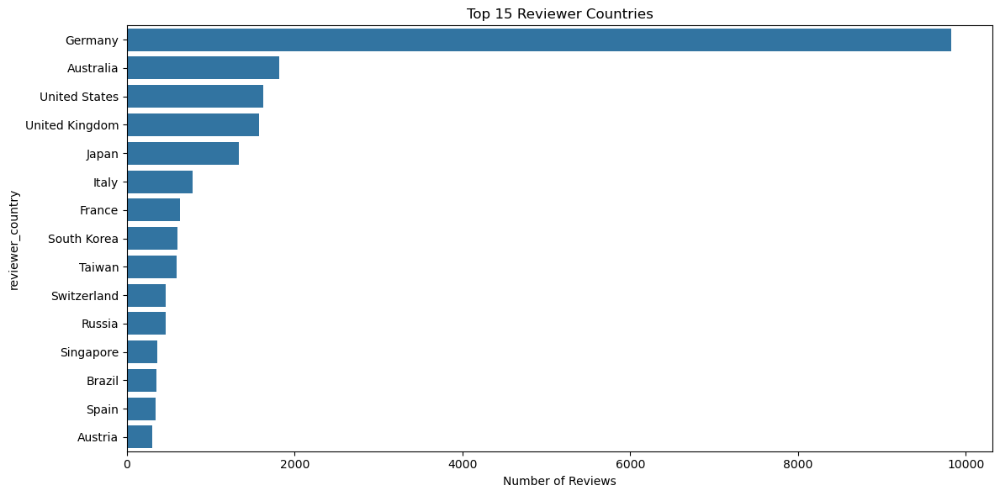

Average Scores by Country (min 5 reviews):
                  review_count  average_score
reviewer_country                             
Uganda                       6           5.00
Texas                        7           5.00
Florida                      7           5.00
Georgia                     15           4.97
Egypt                       10           4.95
Venezuela                    9           4.94
Costa Rica                  11           4.91
Moldova                     10           4.90
Belarus                     15           4.90
Peru                        26           4.88


In [92]:
# Top reviewer countries
plt.figure(figsize=(12, 6))
top_countries = df_clean['reviewer_country'].value_counts().head(15)
sns.barplot(x=top_countries.values, y=top_countries.index)
plt.title('Top 15 Reviewer Countries')
plt.xlabel('Number of Reviews')
plt.tight_layout()
plt.show()

# Average score by country (for countries with sufficient reviews)
country_stats = df_clean.groupby('reviewer_country').agg({
    'review_score': ['count', 'mean']
}).round(2)
country_stats.columns = ['review_count', 'average_score']
country_stats = country_stats[country_stats['review_count'] >= 5].sort_values('average_score', ascending=False)

print("Average Scores by Country (min 5 reviews):")
print(country_stats.head(10))

#### Review Text Analysis

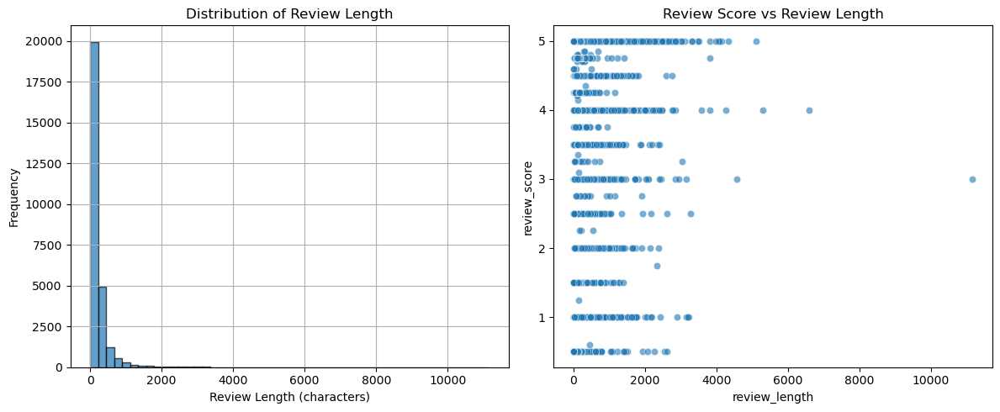

Average review length: 182 characters
Median review length: 96 characters


In [96]:
# Basic text analysis
df_clean['review_length'] = df_clean['cleaned_review_text'].str.len()

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
df_clean['review_length'].hist(bins=50, alpha=0.7, edgecolor='black')
plt.title('Distribution of Review Length')
plt.xlabel('Review Length (characters)')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
sns.scatterplot(data=df_clean, x='review_length', y='review_score', alpha=0.6)
plt.title('Review Score vs Review Length')

plt.tight_layout()
plt.show()

print(f"Average review length: {df_clean['review_length'].mean():.0f} characters")
print(f"Median review length: {df_clean['review_length'].median():.0f} characters")

#### Correlation Matrix on review_score and number_of_nights

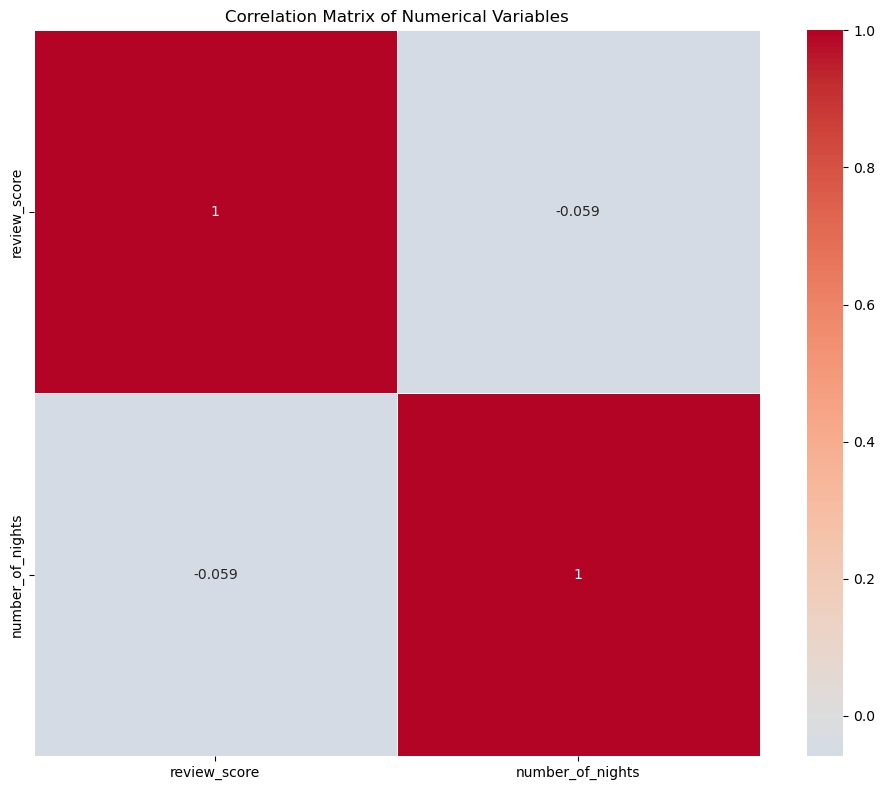

In [99]:
# Correlation matrix for numerical variables
numerical_df = df_clean.select_dtypes(include=[np.number]).drop(columns=['id','review_lag_days','review_length'])
plt.figure(figsize=(10, 8))
sns.heatmap(numerical_df.corr(), annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5)
plt.title('Correlation Matrix of Numerical Variables')
plt.tight_layout()
plt.show()

#### Key Insights (Pandas)

In [102]:
def generate_insights(df):
    insights = []
    
    # Basic stats
    insights.append(f"Total Reviews: {len(df_clean):,}")
    insights.append(f"Average Review Score: {df_clean['review_score'].mean():.2f}")
    insights.append(f"Most Common Traveler Type: {df_clean['traveler_type'].mode().iloc[0]}")
    insights.append(f"Most Common Room Category: {df_clean['room_category'].mode().iloc[0]}")
    insights.append(f"Average Stay Duration: {df_clean['number_of_nights'].mean():.1f} nights")
    
    # Date ranges
    insights.append(f"Review Date Range: {df_clean['review_date'].min()} to {df_clean['review_date'].max()}")
    insights.append(f"Stay Date Range: {df_clean['stay_date'].min()} to {df_clean['stay_date'].max()}")
    
    # Top performers
    top_room_view = df_clean.groupby('room_view')['review_score'].mean().idxmax()
    insights.append(f"Highest Rated Room View: {top_room_view} ({df_clean.groupby('room_view')['review_score'].mean().max():.2f})")
    
    return insights

print("KEY INSIGHTS:")
print("=" * 50)
for insight in generate_insights(df_clean):
    print(f"• {insight}")

KEY INSIGHTS:
• Total Reviews: 27,392
• Average Review Score: 4.65
• Most Common Traveler Type: Couple
• Most Common Room Category: Deluxe Room
• Average Stay Duration: 1.5 nights
• Review Date Range: 1900-09-01 00:00:00 to 2025-09-22 00:00:00
• Stay Date Range: 2014-01-21 11:57:19.145843614 to 2026-01-17 11:57:19.145843614
• Highest Rated Room View: Gardens View (4.68)


#### Text Processing for Word Cloud Analysis

In [105]:
# Text preprocessing for word clouds
def preprocess_text(text):
    """Clean and preprocess text for word cloud"""
    if pd.isna(text) or text == 'No review text provided':
        return ""
    
    # Convert to lowercase
    text = str(text).lower()
    
    # Remove special characters and digits, keep only letters and spaces
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    
    # Remove extra whitespace
    text = ' '.join(text.split())
    
    return text

# Apply text preprocessing
df_clean['cleaned_review_text_wordcloud'] = df_clean['cleaned_review_text'].apply(preprocess_text)

# Create score_category column for word clouds
def categorize_score(score):
    if score >= 4.5:
        return 'Excellent (4.5-5.0)'
    elif score >= 4.0:
        return 'Very Good (4.0-4.4)'
    elif score >= 3.0:
        return 'Good (3.0-3.9)'
    else:
        return 'Poor (<3.0)'

df_clean['score_category'] = df_clean['review_score'].apply(categorize_score)

# Custom stopwords for hotel reviews
custom_stopwords = set(STOPWORDS)
hotel_stopwords = {
    'hotel', 'stay', 'stayed', 'room', 'rooms', 'would', 'could', 'also', 
    'one', 'two', 'three', 'first', 'last', 'stay', 'staying', 'get', 'got',
    'marina', 'bay', 'sands', 'mbs', 'singapore', 'room', 'rooms'
}
custom_stopwords.update(hotel_stopwords)

##### Word Clouds by Review Score Categories

In [110]:
# Create score categories
def categorize_score(score):
    if score >= 4.5:
        return 'Excellent (4.5-5.0)'
    elif score >= 4.0:
        return 'Very Good (4.0-4.4)'
    elif score >= 3.0:
        return 'Good (3.0-3.9)'
    else:
        return 'Poor (<3.0)'

df_clean['score_category'] = df_clean['review_score'].apply(categorize_score)

##### Word Clouds by Traveler Type

Word Clouds by Review Score Categories:


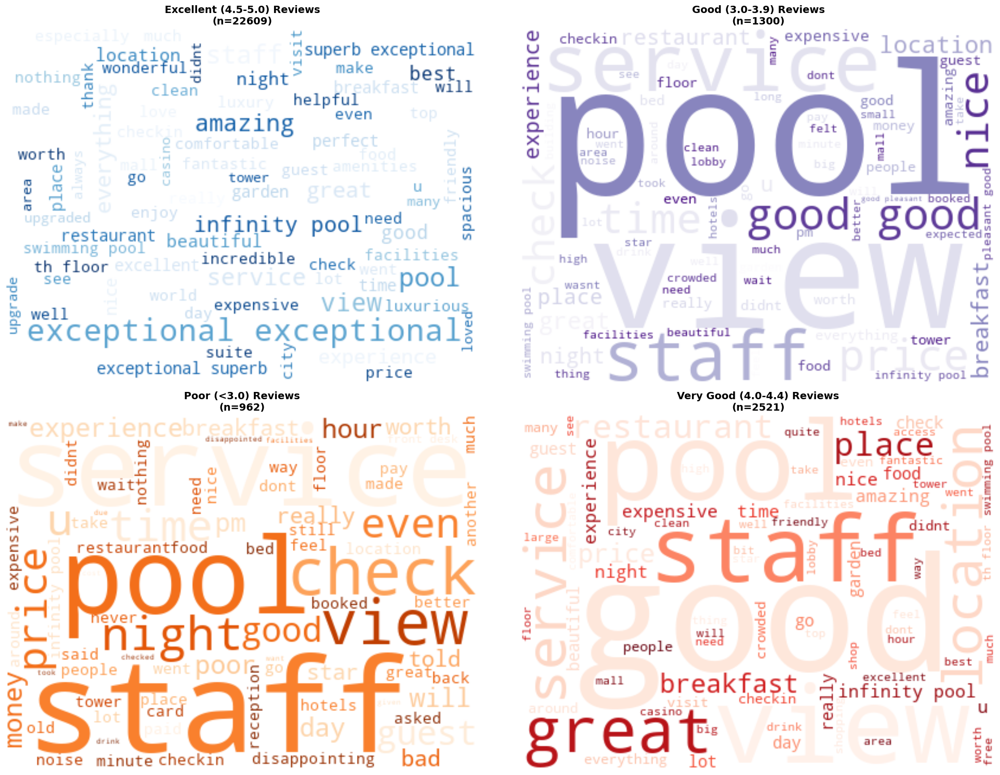

In [113]:
# Fixed Word Clouds by Review Score Categories
print("Word Clouds by Review Score Categories:")
score_categories = df_clean['score_category'].unique()

# Use proper matplotlib colormaps
colormaps = ['Blues', 'Purples', 'Oranges', 'Reds']

fig, axes = plt.subplots(2, 2, figsize=(20, 15))
axes = axes.ravel()

for i, category in enumerate(sorted(score_categories)):
    category_reviews = ' '.join(df_clean[df_clean['score_category'] == category]['cleaned_review_text_wordcloud'].tolist())
    
    if category_reviews.strip():
        wordcloud = WordCloud(
            width=400, height=300, 
            background_color='white',
            stopwords=custom_stopwords,
            max_words=80,
            colormap=colormaps[i],
            random_state=42
        ).generate(category_reviews)
        
        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].set_title(f'{category} Reviews\n(n={len(df_clean[df_clean["score_category"] == category])})', 
                         fontsize=14, fontweight='bold')
    else:
        axes[i].text(0.5, 0.5, 'No reviews', ha='center', va='center', transform=axes[i].transAxes, fontsize=12)
    
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Word Clouds by Traveler Type:


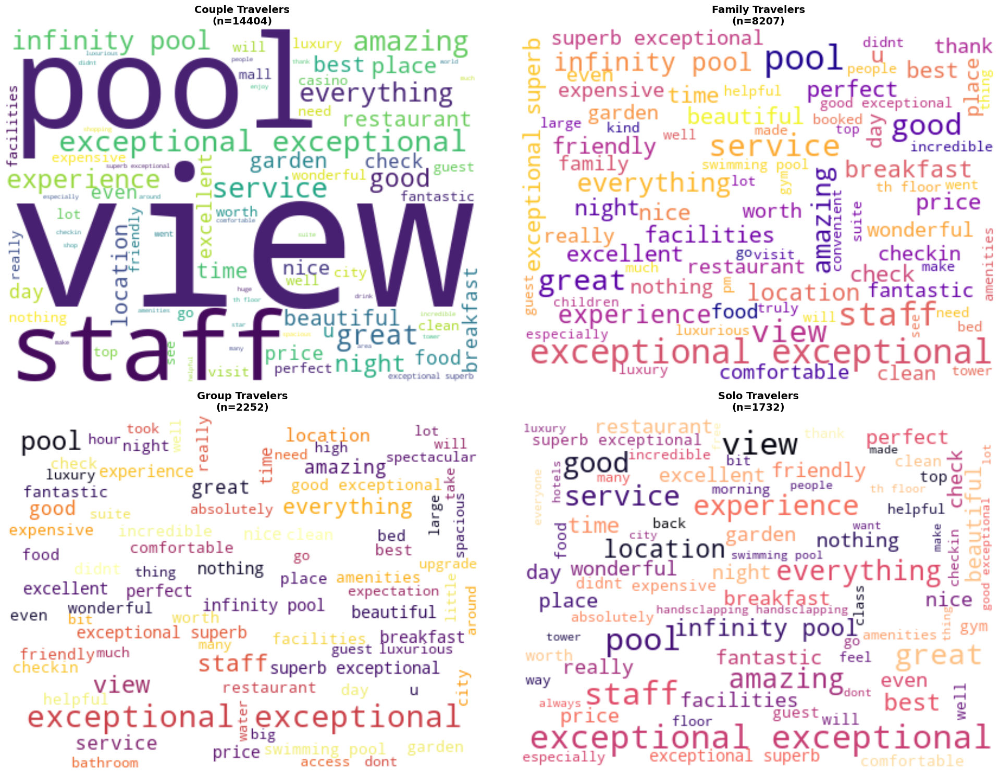

In [115]:
# Additional Word Clouds by Traveler Type
print("Word Clouds by Traveler Type:")
top_travelers = df_clean['traveler_type'].value_counts().head(4).index

fig, axes = plt.subplots(2, 2, figsize=(20, 15))
axes = axes.ravel()

# Use different colormaps for variety
traveler_colormaps = ['viridis', 'plasma', 'inferno', 'magma']

for i, traveler in enumerate(top_travelers):
    traveler_reviews = ' '.join(df_clean[df_clean['traveler_type'] == traveler]['cleaned_review_text_wordcloud'].tolist())
    
    if traveler_reviews.strip():
        wordcloud = WordCloud(
            width=400, height=300, 
            background_color='white',
            stopwords=custom_stopwords,
            max_words=80,
            colormap=traveler_colormaps[i],
            random_state=42
        ).generate(traveler_reviews)
        
        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].set_title(f'{traveler} Travelers\n(n={len(df_clean[df_clean["traveler_type"] == traveler])})', 
                         fontsize=14, fontweight='bold')
    else:
        axes[i].text(0.5, 0.5, 'No reviews', ha='center', va='center', transform=axes[i].transAxes, fontsize=12)
    
    axes[i].axis('off')

plt.tight_layout()
plt.show()


##### Overall Word Cloud

Overall Word Cloud:


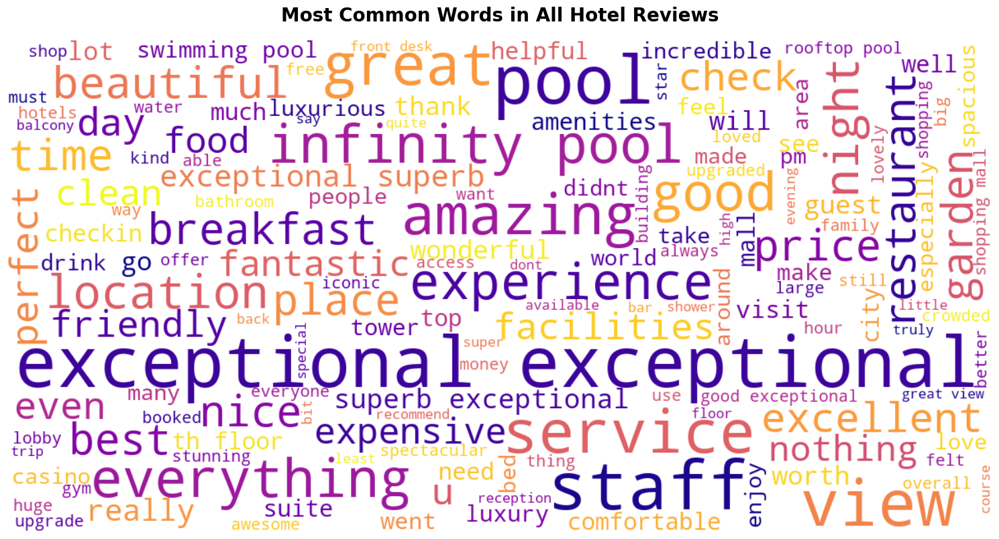

In [117]:
# Overall Word Cloud
print("Overall Word Cloud:")
all_reviews = ' '.join(df_clean['cleaned_review_text_wordcloud'].tolist())

plt.figure(figsize=(15, 8))
wordcloud = WordCloud(
    width=1200, 
    height=600, 
    background_color='white',
    stopwords=custom_stopwords,
    max_words=150,
    colormap='plasma',
    random_state=42
).generate(all_reviews)

plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Common Words in All Hotel Reviews', fontsize=20, fontweight='bold', pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

##### Word Frequency Analysis

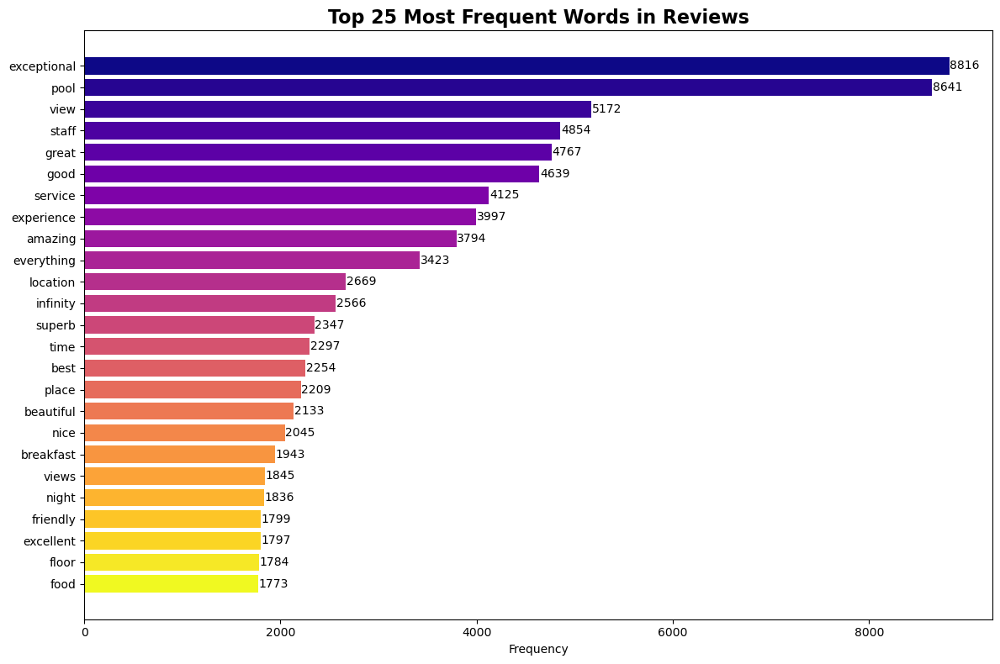

In [119]:
# Word Frequency Analysis

def analyze_word_frequency(text, top_n=25):
    """Analyze word frequency in text"""
    words = text.split()
    # Filter out stopwords and short words
    filtered_words = [word for word in words if word not in custom_stopwords and len(word) > 2]
    word_freq = Counter(filtered_words)
    return word_freq.most_common(top_n)
    
# Analyze overall word frequency
top_words = analyze_word_frequency(all_reviews, 25)

# Create bar chart for top words
plt.figure(figsize=(12, 8))
words, frequencies = zip(*top_words)
colors = plt.cm.plasma(np.linspace(0, 1, len(words)))

bars = plt.barh(words, frequencies, color=colors)
plt.xlabel('Frequency')
plt.title('Top 25 Most Frequent Words in Reviews', fontsize=16, fontweight='bold')
plt.gca().invert_yaxis()

# Add value labels on bars
for bar, freq in zip(bars, frequencies):
    plt.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2, 
             f'{freq}', ha='left', va='center', fontsize=10)

plt.tight_layout()
plt.show()


#### Final Data Quality Report

In [121]:
# Final Data Quality Report
print("=" * 60)
print("FINAL DATA QUALITY REPORT")
print("=" * 60)
print(f"Total records: {len(df_clean):,}")
print(f"Complete cases: {df_clean.notnull().all(axis=1).sum():,}")
print(f"Data completeness: {df_clean.notnull().all(axis=1).sum() / len(df_clean) * 100:.2f}%")
print(f"Average review score: {df_clean['review_score'].mean():.2f}")
print(f"Average stay duration: {df_clean['number_of_nights'].mean():.1f} nights")
print(f"Average review length: {df_clean['review_length'].mean():.0f} characters")
print(f"\nReview score distribution:")
print(df_clean['score_category'].value_counts().sort_index())
print(f"\nTop traveler types:")
print(df_clean['traveler_type'].value_counts().head())
print(f"\nTop reviewer countries:")
print(df_clean['reviewer_country'].value_counts().head())

FINAL DATA QUALITY REPORT
Total records: 27,392
Complete cases: 27,387
Data completeness: 99.98%
Average review score: 4.65
Average stay duration: 1.5 nights
Average review length: 182 characters

Review score distribution:
score_category
Excellent (4.5-5.0)    22609
Good (3.0-3.9)          1300
Poor (<3.0)              962
Very Good (4.0-4.4)     2521
Name: count, dtype: int64

Top traveler types:
traveler_type
Couple     14404
Family      8207
Group       2252
Solo        1732
Friends      509
Name: count, dtype: int64

Top reviewer countries:
reviewer_country
Germany           9828
Australia         1814
United States     1626
United Kingdom    1576
Japan             1338
Name: count, dtype: int64


#### Export

In [124]:
# Export the DataFrame to a CSV file with UTF-8 encoding
df_clean.to_csv("../Output/imputed_reviews_pandas.csv", index=False, encoding='utf-8')

print("DataFrame exported to imputed_reviews_pandas.csv (UTF-8) in the Output directory")

DataFrame exported to imputed_reviews_pandas.csv (UTF-8) in the Output directory


### Benchmarking Section
Two processing steps from the above are selected for benchmarking.
1. Data Imputation & Cleaning: This is a heavy-duty "ETL" task with lots of calculations, joins, and conditional logic.
2. Text Processing & Aggregation: This is a string-heavy task that tests a completely different part of each library's performance (splitting, regex, and high-cardinality grouping).

To ensure a rigorous and fair benchmark, a specific methodology was adopted. Each benchmark task was executed 10 times, with the median runtime reported to mitigate the impact of outliers from system noise. Memory usage, however, was measured differently, as it can be skewed by Python's internal memory pooling. To capture an accurate incremental increase, the memory benchmark was based only on the first run of each library's task (Pandas and Polars) immediately following a fresh kernel restart, ensuring a clean and comparable environment for each library's initial allocation.

In [3]:
def run_benchmark(func, library_name, n_runs=10):
    """
    A generic utility to measure execution time and memory usage for each run.
    
    - Measures time for all runs.
    - Measures memory on the first run only (to avoid skewed results).
    - Returns a list of dictionaries, one for each run.
    """
    print(f"--- Running benchmark for {library_name} (running {n_runs} loops) ---")
    
    process = psutil.Process(os.getpid())
    run_results_list = [] # Will hold the stats for each run
    
    # Get library and task names
    parts = library_name.split(' ')
    lib_name = parts[0]
    task_name = " ".join(parts[1:])
    
    result_df = None # To store the final DataFrame
    
    for i in range(n_runs):
        # --- 1. Measure Memory (Only for first run) ---
        mem_used = None # Default to None for this run
        if i == 0:
            mem_before = process.memory_info().rss / (1024 ** 2)
        
        # --- 2. Run and Time the Function ---
        start_time = time.perf_counter()
        result_df = func() # Execute
        end_time = time.perf_counter()

        time_taken = end_time - start_time
        
        # --- 3. Record Memory (Only for first run) ---
        if i == 0:
            mem_after = process.memory_info().rss / (1024 ** 2)
            mem_used = mem_after - mem_before
        
        # --- 4. Append stats for this specific run ---
        run_results_list.append({
            "Library": lib_name,
            "Task": task_name,
            "Run": i + 1,
            "Time (s)": time_taken,
            "Memory (MB)": mem_used # Will be None for all runs except the first
        })
        
        # Print progress
        mem_str = f"{mem_used:.2f} MB" if mem_used is not None else "N/A (first run only)"
        print(f"Run {i+1}/{n_runs} | Time: {time_taken:.4f}s | Memory: {mem_str}")

    print("-" * (40 + len(library_name)), "\n")
    
    # Return the list of all run dictionaries and the final df (for the next step)
    return run_results_list, result_df

In [5]:
# --- Define custom stopwords (needed for text analysis) ---
custom_stopwords = set(STOPWORDS)
hotel_stopwords = {
    'hotel', 'stay', 'stayed', 'room', 'rooms', 'would', 'could', 'also', 
    'one', 'two', 'three', 'first', 'last', 'stay', 'staying', 'get', 'got',
    'marina', 'bay', 'sands', 'mbs', 'singapore', 'room', 'rooms'
}
custom_stopwords.update(hotel_stopwords)

#### Benchmark Task 1: Data Imputation & Feature Engineering

In [8]:
def benchmark_imputation_pandas():
    """
    Loads raw data and runs the full Pandas imputation and 
    feature engineering pipeline.
    """
    # Load raw data
    df = pd.read_csv("../Output/cleaned_reviews_polars.csv")
    df_clean = df.copy()

    # --- 1. Imputation (matching your logic) ---
    df_clean['reviewer_name'] = df_clean['reviewer_name'].fillna('Anonymous')
    df_clean['cleaned_review_text'] = df_clean['review_text'].fillna('No review text provided') # New col
    
    review_score_median = df_clean['review_score'].median()
    df_clean['review_score'] = df_clean['review_score'].fillna(review_score_median)

    df_clean['review_date'] = pd.to_datetime(df_clean['review_date'], errors='coerce')
    df_clean['stay_date'] = pd.to_datetime(df_clean['stay_date'], errors='coerce')

    # Robust lag calculation
    available_review_lag = (df_clean['review_date'] - df_clean['stay_date']).dt.days
    avg_review_lag = available_review_lag[available_review_lag >= 0].mean() # Filter for valid lags

    if pd.notna(avg_review_lag):
        lag_timedelta = pd.Timedelta(days=avg_review_lag)
        mask_review_missing = df_clean['review_date'].isna() & df_clean['stay_date'].notna()
        df_clean.loc[mask_review_missing, 'review_date'] = df_clean.loc[mask_review_missing, 'stay_date'] + lag_timedelta
        
        mask_stay_missing = df_clean['stay_date'].isna() & df_clean['review_date'].notna()
        df_clean.loc[mask_stay_missing, 'stay_date'] = df_clean.loc[mask_stay_missing, 'review_date'] - lag_timedelta

    default_date = pd.Timestamp('2025-01-01')
    most_common_review_date = df_clean['review_date'].mode()[0] if not df_clean['review_date'].mode().empty else default_date
    df_clean['review_date'] = df_clean['review_date'].fillna(most_common_review_date)
    
    most_common_stay_date = df_clean['stay_date'].mode()[0] if not df_clean['stay_date'].mode().empty else default_date
    df_clean['stay_date'] = df_clean['stay_date'].fillna(most_common_stay_date)

    most_common_country = df_clean['reviewer_country'].mode()[0] if not df_clean['reviewer_country'].mode().empty else 'Unknown'
    df_clean['reviewer_country'] = df_clean['reviewer_country'].fillna(most_common_country)
    
    mask_room_type_missing = df_clean['room_type'].isna()
    df_clean.loc[mask_room_type_missing, 'room_type'] = df_clean.loc[mask_room_type_missing, 'room_category']
    most_common_room_type = df_clean['room_type'].mode()[0] if not df_clean['room_type'].mode().empty else 'Standard Room'
    df_clean['room_type'] = df_clean['room_type'].fillna(most_common_room_type)

    nights_median = df_clean['number_of_nights'].median()
    df_clean['number_of_nights'] = df_clean['number_of_nights'].fillna(nights_median)
    
    most_common_traveler = df_clean['traveler_type'].mode()[0] if not df_clean['traveler_type'].mode().empty else 'Couple'
    df_clean['traveler_type'] = df_clean['traveler_type'].fillna(most_common_traveler)

    # --- 2. Feature Engineering ---
    df_clean['review_lag_days'] = (df_clean['review_date'] - df_clean['stay_date']).dt.days
    df_clean['review_length'] = df_clean['cleaned_review_text'].str.len()

    return df_clean

In [10]:
def benchmark_imputation_polars():
    """
    Loads raw data and runs the full Polars imputation and 
    feature engineering pipeline.
    """
    # Load raw data
    df = pl.read_csv("../Output/cleaned_reviews_polars.csv")
    
    # --- 0. Pre-calculations ---
    review_score_median = df.select(pl.col("review_score").median()).item()
    lag_expr = (pl.col("review_date").str.to_datetime(strict=False) - pl.col("stay_date").str.to_datetime(strict=False)).dt.total_days().floor()
    avg_review_lag_days = df.select(lag_expr.filter(lag_expr >= 0).mean()).item() # Filter for valid lags
    
    avg_lag_timedelta = None
    if avg_review_lag_days is not None:
        avg_lag_timedelta = pl.duration(days=avg_review_lag_days)

    default_date = datetime(2025, 1, 1)
    most_common_review_date = df.select(pl.col("review_date").str.to_datetime(strict=False).mode().first().fill_null(default_date)).item()
    most_common_stay_date = df.select(pl.col("stay_date").str.to_datetime(strict=False).mode().first().fill_null(default_date)).item()
    most_common_country = df.select(pl.col("reviewer_country").mode().first().fill_null("Unknown")).item()
    most_common_room_type = df.select(pl.col("room_type").mode().first().fill_null("Standard Room")).item()
    nights_median = df.select(pl.col("number_of_nights").median()).item()
    most_common_traveler = df.select(pl.col("traveler_type").mode().first().fill_null("Couple")).item()

    # --- 1. Main Imputation (Pass 1) ---
    df_clean = df.with_columns(
        pl.col("reviewer_name").fill_null("Anonymous"),
        pl.col("review_text").fill_null("No review text provided").alias("cleaned_review_text"), # New col
        pl.col("review_score").fill_null(review_score_median),
        pl.col("review_date").str.to_datetime(strict=False),
        pl.col("stay_date").str.to_datetime(strict=False),
        pl.col("reviewer_country").fill_null(most_common_country),
        pl.col("room_type").fill_null(pl.col("room_category")),
        pl.col("number_of_nights").fill_null(nights_median),
        pl.col("traveler_type").fill_null(most_common_traveler)
    )

    # --- 1. Main Imputation (Pass 2) ---
    df_clean = df_clean.with_columns(
        pl.when(
            pl.col("review_date").is_null() & 
            pl.col("stay_date").is_not_null() & 
            (avg_lag_timedelta is not None)
        )
        .then(pl.col("stay_date") + avg_lag_timedelta)
        .otherwise(pl.col("review_date"))
        .fill_null(most_common_review_date)
        .alias("review_date"),
        pl.when(
            pl.col("stay_date").is_null() & 
            pl.col("review_date").is_not_null() & 
            (avg_lag_timedelta is not None)
        )
        .then(pl.col("review_date") - avg_lag_timedelta)
        .otherwise(pl.col("stay_date"))
        .fill_null(most_common_stay_date)
        .alias("stay_date"),
        pl.col("room_type").fill_null(most_common_room_type)
    )

    # --- 2. Feature Engineering ---
    df_clean = df_clean.with_columns(
        (pl.col("review_date") - pl.col("stay_date")).dt.total_days().alias("review_lag_days"),
        pl.col("cleaned_review_text").str.len_chars().alias("review_length")
    )
    
    return df_clean

#### Benchmark Task 2: Word Frequency Analysis

In [13]:
# --- Helper functions for Pandas ---
def preprocess_text_pandas(text):
    if pd.isna(text) or text == 'No review text provided':
        return ""
    text = str(text).lower()
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    text = ' '.join(text.split())
    return text

def analyze_word_frequency_pandas(text, top_n=25):
    words = text.split()
    filtered_words = [word for word in words if word not in custom_stopwords and len(word) > 2]
    word_freq = Counter(filtered_words)
    return word_freq.most_common(top_n)

# --- Benchmark Functions ---

def benchmark_text_analysis_pandas():
    """
    Loads imputed data, runs Pandas text cleaning, and 
    performs word frequency aggregation.
    """
    # Load the imputed data
    try:
        df_clean = pd.read_csv("../Output/intermediate_imputed_reviews_pandas.csv")
    except FileNotFoundError:
        print("Pandas imputed file not found. Skipping benchmark.")
        return None

    # 1. Text processing
    df_clean['cleaned_review_text_wordcloud'] = df_clean['cleaned_review_text'].apply(preprocess_text_pandas)
    
    # 2. Aggregation
    all_reviews = ' '.join(df_clean['cleaned_review_text_wordcloud'].tolist())
    top_words = analyze_word_frequency_pandas(all_reviews, 25)
    
    return pd.DataFrame(top_words, columns=['word', 'count'])


def benchmark_text_analysis_polars():
    """
    Loads imputed data, runs Polars text cleaning, and 
    performs word frequency aggregation.
    """
    # Load the imputed data
    try:
        df_clean = pl.read_csv("../Output/intermediate_imputed_reviews_polars.csv")
    except FileNotFoundError:
        print("Polars imputed file not found. Skipping benchmark.")
        return None

    # 1. Text processing
    df_clean = df_clean.with_columns(
        pl.when(
            (pl.col("cleaned_review_text").is_null()) | 
            (pl.col("cleaned_review_text") == "No review text provided")
        )
        .then(pl.lit(""))
        .otherwise(
            pl.col("cleaned_review_text")
              .str.to_lowercase()
              .str.replace_all(r"[^a-zA-Z\s]", "")
              .str.replace_all(r"\s+", " ")
              .str.strip_chars()
        )
        .alias("cleaned_review_text_wordcloud")
    )
    
    # 2. Aggregation
    top_words_df = (
        df_clean.select(
            pl.col("cleaned_review_text_wordcloud").str.split(" ")
        )
        .explode("cleaned_review_text_wordcloud")
        .rename({"cleaned_review_text_wordcloud": "word"})
        .filter(
            pl.col("word").is_in(custom_stopwords).not_() & 
            (pl.col("word").str.len_chars() > 2) &
            (pl.col("word") != "")
        )
        .get_column("word")
        .value_counts(sort=True) 
        .head(25)
    )
    
    return top_words_df

#### Run the Benchmarks

In [16]:
print("\n" + "="*60)
print("STARTING EDA PERFORMANCE BENCHMARKS (Pandas vs Polars)")
print("="*60 + "\n")

all_run_stats = [] # This will hold the detailed, run-by-run stats
output_dir = "../Output"
benchmark_dir = "../Benchmarking"
N_RUNS = 10 # Set the number of loops

# --- Run Task 1: Imputation ---
run_stats_list, pd_imputed_df = run_benchmark(benchmark_imputation_pandas, "Pandas Imputation", n_runs=N_RUNS)
all_run_stats.extend(run_stats_list) # Use .extend() to add all runs

run_stats_list, pl_imputed_df = run_benchmark(benchmark_imputation_polars, "Polars Imputation", n_runs=N_RUNS)
all_run_stats.extend(run_stats_list)

# --- Save imputed files for Task 2 ---
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
print(f"Saving imputed files to {output_dir}...")
pd_imputed_df.to_csv(f"{output_dir}/intermediate_imputed_reviews_pandas.csv", index=False, encoding='utf-8')
pl_imputed_df.write_csv(f"{output_dir}/intermediate_imputed_reviews_polars.csv")
print("Save complete.\n")

# --- Run Task 2: Text Analysis ---
run_stats_list, pd_word_freq_df = run_benchmark(benchmark_text_analysis_pandas, "Pandas Text Analysis", n_runs=N_RUNS)
if pd_word_freq_df is not None:
    all_run_stats.extend(run_stats_list)

run_stats_list, pl_word_freq_df = run_benchmark(benchmark_text_analysis_polars, "Polars Text Analysis", n_runs=N_RUNS)
if pl_word_freq_df is not None:
    all_run_stats.extend(run_stats_list)

print("\n--- All Benchmarks Complete ---")

# --- Display and Save Summaries ---
print("\n" + "="*45)
print("BENCHMARKING SUMMARY")
print("="*45)

if all_run_stats:
    # 1. Create and save the DETAILED run-by-run DataFrame
    detailed_summary_df = pd.DataFrame(all_run_stats)
    
    if not os.path.exists(benchmark_dir):
        os.makedirs(benchmark_dir)
        
    detailed_path = f"{benchmark_dir}/EDA_Benchmarking_Detailed_Runs.csv"
    detailed_summary_df.to_csv(detailed_path, index=False)
    print(f"Detailed run-by-run stats saved to: {detailed_path}")

    # 2. Create the AGGREGATE summary for plotting
    summary_df = detailed_summary_df.groupby(['Library', 'Task']).agg(
        # Get the median time from all runs
        **{'Time (s)': ('Time (s)', 'median')}, 
        # Get the memory from the first run (it's the only non-null value)
        **{'Memory (MB)': ('Memory (MB)', 'first')} 
    ).reset_index()
    
    print("\n--- AGGREGATE SUMMARY (Median Time, First-Run Memory) ---")
    print(summary_df.to_string(index=False))
    
    summary_path = f"{benchmark_dir}/EDA_Benchmarking_Aggregate_Summary.csv"
    summary_df.to_csv(summary_path, index=False)
    print(f"\nAggregate summary saved to: {summary_path}")
else:
    print("No benchmarks were run.")
print("="*45)


STARTING EDA PERFORMANCE BENCHMARKS (Pandas vs Polars)

--- Running benchmark for Pandas Imputation (running 10 loops) ---
Run 1/10 | Time: 0.1862s | Memory: 51.53 MB
Run 2/10 | Time: 0.1565s | Memory: N/A (first run only)
Run 3/10 | Time: 0.1538s | Memory: N/A (first run only)
Run 4/10 | Time: 0.1527s | Memory: N/A (first run only)
Run 5/10 | Time: 0.1537s | Memory: N/A (first run only)
Run 6/10 | Time: 0.1527s | Memory: N/A (first run only)
Run 7/10 | Time: 0.1537s | Memory: N/A (first run only)
Run 8/10 | Time: 0.1516s | Memory: N/A (first run only)
Run 9/10 | Time: 0.1518s | Memory: N/A (first run only)
Run 10/10 | Time: 0.1586s | Memory: N/A (first run only)
--------------------------------------------------------- 

--- Running benchmark for Polars Imputation (running 10 loops) ---
Run 1/10 | Time: 0.1082s | Memory: 47.66 MB
Run 2/10 | Time: 0.0574s | Memory: N/A (first run only)
Run 3/10 | Time: 0.0575s | Memory: N/A (first run only)
Run 4/10 | Time: 0.0576s | Memory: N/A (firs

#### Visualize the Results

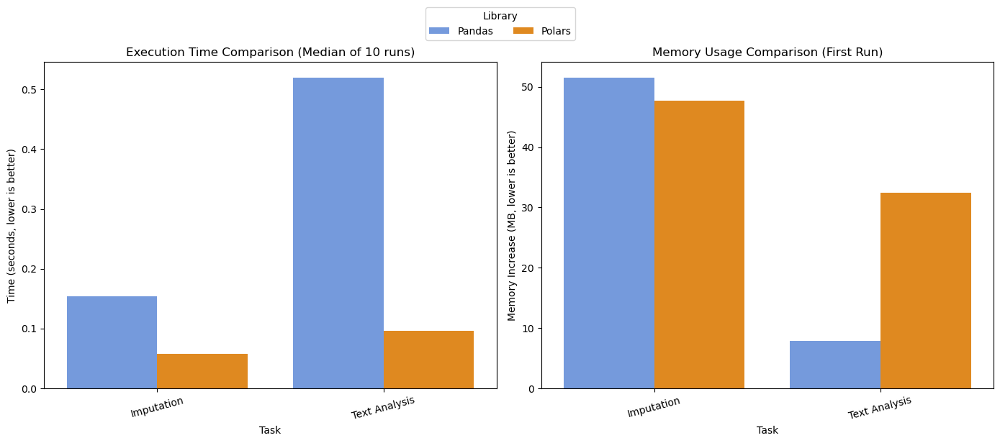

In [18]:
# Visualize the Aggregate Results
if 'summary_df' in locals():
    # (Your existing plotting code will now work perfectly with `summary_df`)
    custom_palette = {"Pandas": "cornflowerblue", "Polars": "darkorange"}
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    sns.barplot(data=summary_df, x="Task", y="Time (s)", hue="Library", ax=axes[0], palette=custom_palette)
    axes[0].set_title("Execution Time Comparison (Median of 10 runs)")
    axes[0].set_ylabel("Time (seconds, lower is better)")
    axes[0].tick_params(axis='x', rotation=15)
    axes[0].get_legend().remove()

    sns.barplot(data=summary_df, x="Task", y="Memory (MB)", hue="Library", ax=axes[1], palette=custom_palette)
    axes[1].set_title("Memory Usage Comparison (First Run)")
    axes[1].set_ylabel("Memory Increase (MB, lower is better)")
    axes[1].tick_params(axis='x', rotation=15)
    handles, labels = axes[1].get_legend_handles_labels()
    axes[1].get_legend().remove()
    
    fig.legend(handles, labels, title="Library", loc='upper center', bbox_to_anchor=(0.5, 1.03), ncol=2)
    fig.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()